# Project 1 - Econ 430
## Group Members:
1. Andrea Riccardo Assenza (006548376)
2. Kojo Manu (206545334)
3. Joshua Onozawa (506549019)
4. Rizky Rizaldi Ronaldo (706377502)

## Project Motivation
GPA is a key indicator of a student's academic ability and mastery of material throughout college. Many schools require students to maintain a minimum GPA to graduate, and achieving a high GPA often qualifies students for academic honors and scholarships. Beyond the academic environment, GPA can play a significant role in career opportunities, as employers and internship programs sometimes use it as an initial screening criterion in their hiring processes.

In this project, we aim to analyze the factors that influence GPA using the gpa2 dataset from the Wooldridge package. Our motivation is to understand how past academic performance, such as high school grades, and demographic factors, such as gender and ethnicity, affect college GPA.

## Data Description
The data used for our project is the gpa2 dataset from the Wooldridge package (Wooldridge, 2013). This dataset comes from a midsize research university supporting men’s and women’s athletics at the Division I level. The sample consists of 4,137 students who attended the university, including both athletes and non-athletes.

The academic year during which the data was collected was anonymized for confidentiality reasons. Our findings and conclusions drawn from this dataset may not be generalizable to other educational institutions since the source of our data comes from a single midsize research university.

The dataset contains 12 variables, each capturing the students' key academic and demographic characteristics. The variables are as follows:

1. sat: The student’s total SAT score, combining both verbal and math components.

2. tothrs: The cumulative study hours (i.e., credit hours) up to the fall semester. This interpretation is based on examining the distribution of this variable in a histogram (refer to ‘Description of Data Analysis’ section).

3. colgpa: The student’s GPA after the fall semester.

4. athlete: An indicator variable equal to 1 if the student is an athlete.

5. verbmath: The student’s ratio of SAT scores; verbal score / math score.

6. hsize: The size of the student’s graduating high school class, measured in 100s.

7. hsrank: The student’s rank in their high school graduating class.

8. hsperc: The student’s high school percentile, measured from the top (e.g., top 20%).

9. female: An indicator variable equal to 1 if the student is female.

10. white: An indicator variable equal to 1 if the student is white.

11. black: An indicator variable equal to 1 if the student is black.

12. hsizesq: The size of the student’s graduating high school class, measured in 100s, squared.

Based on the above variable descriptions, we chose the GPA after the fall semester (colgpa) as the dependent variable and sat, tothrs, hsperc, female, and white as the independent variables. These choices were made based on their potential influence on a student's academic performance:

1. SAT score (sat): SAT scores are commonly used in college applications to assess academic ability, verbal reasoning, and mathematics. We hypothesized that higher SAT scores positively correlate with college GPA, as students with stronger academic preparation may perform better.

2. Cumulative study hours (tothrs): The total number of credit hours reflects the student's academic level, engagement, and experience. While we cannot fully conclude that GPA improves over time in college, we hypothesized a slightly positive correlation between cumulative hours and GPA, as students may develop better time management skills and study habits as they progress through college.

3. High school percentile (hsperc): This variable measures students' past academic performance relative to their high school class rank. We hypothesized that students who graduated at the top of their class (i.e., with a smaller hsperc value) would receive a higher GPA, implying a negative correlation between high school percentile and college GPA.

4. Gender (female) and Race (white): These indicator variables were included to explore potential differences in academic performance between male and female students and students of different racial backgrounds. We were unsure about the effect of the female variable. However, we hypothesized a positive correlation between the white variable and college GPA, as socioeconomic and institutional factors may influence academic outcomes and access to educational resources.

## Table of Contents
1. Descriptive Analysis:
- ***(a)** Univariate Descriptive Analysis*
- ***(b)** Exploratory Data Analysis (EDA)*
- ***(c)** Density Estimations*
- ***(d)** Non-linearity and Variable Transformations*
- ***(e)** Outliers and Missing Data*

2. Variable Selection:
- ***(a)** Boruta Algorithm*
- ***(b)** Mallows $C_p$*
  
3. Model Building
- ***(a)** Model 1: x = hsperc*
- ***(b)** Model 2: x = sat*
- ***(c)** Model 3: x = hscperc_sqrt*
- ***(d)** Model 4: x = log_hsperc*

## Data Loading and Preliminary Analysis

In [1]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import random; random.seed(10) # pre-setting seed
from scipy import stats
from scipy.stats import norm, chi2, f
import wooldridge as woo
# Numpy version matters for scipy

# For model fitting
import statsmodels.api as sm
import statsmodels.stats.api as sms
import statsmodels.formula.api as smf
from statsmodels.graphics import regressionplots
from statsmodels.stats.multicomp import MultiComparison
from fitter import Fitter # might require install, numpy version matters
from statsmodels.robust.robust_linear_model import RLM
from statsmodels.iolib.summary2 import summary_col
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import linear_reset
from sklearn import preprocessing
from sklearn.utils import resample
from itertools import combinations
from sklearn.model_selection import train_test_split

# Subset regressions & feature selection
from sklearn.linear_model import LinearRegression
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

# Boruta
from sklearn.ensemble import RandomForestRegressor
from boruta import BorutaPy
#from BorutaShap import BorutaShap # use .py file version

# Heteroskedasticity
from statsmodels.stats.diagnostic import het_breuschpagan, het_white, het_goldfeldquandt

# Missing data imputation
from sklearn.impute import KNNImputer
from statsmodels.imputation import mice


# For R kernel
# Note: need working copy of R, initiate chunk with `%%R`
import rpy2.ipython
%load_ext rpy2.ipython
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
pandas2ri.activate()

In [2]:
# Importing the data and understanding the structure of the data

gpa = pd.DataFrame(woo.data('gpa2'))
print(gpa.head())
print(gpa.info())
print(gpa.isnull().sum())
print(gpa.isnull().any())
print(gpa.describe())

    sat  tothrs  colgpa  athlete  verbmath  hsize  hsrank     hsperc  female  \
0   920      43    2.04        1   0.48387   0.10       4  40.000000       1   
1  1170      18    4.00        0   0.82813   9.40     191  20.319149       0   
2   810      14    1.78        1   0.88372   1.19      42  35.294117       0   
3   940      40    2.42        0   0.80769   5.71     252  44.133099       0   
4  1180      18    2.61        0   0.73529   2.14      86  40.186916       0   

   white  black    hsizesq  
0      0      0   0.010000  
1      1      0  88.360001  
2      1      0   1.416100  
3      1      0  32.604099  
4      1      0   4.579600  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4137 entries, 0 to 4136
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   sat       4137 non-null   int64  
 1   tothrs    4137 non-null   int64  
 2   colgpa    4137 non-null   float64
 3   athlete   4137 non-null   int64  
 4  

In [ ]:
#copy the dataset
gpa2 = gpa.copy()

# List of variables to drop
var_to_drop = ['verbmath', 'hsize', 'hsrank', 'athlete', 'black', 'hsizesq']

gpa2 = gpa.drop(columns=var_to_drop)

There are no null values in all columns. We dropped the columns that we are not using for our analysis.

## 1. Descriptive Analysis

### 1a. Univariate Descriptive Analysis

In [4]:
desc = gpa2.describe()
desc.loc['skew'] = desc.apply(lambda x: stats.skew(x))
desc.loc['kurtosis'] = desc.apply(lambda x: stats.kurtosis(x))
desc

,sat,tothrs,colgpa,hsperc,female,white
count,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000
mean,1030.331158,52.832246,2.652686,19.237070,0.449601,0.925550
std,139.401392,35.329595,0.658635,16.568727,0.497514,0.262534
min,470.000000,6.000000,0.000000,0.166667,0.000000,0.000000
25%,940.000000,17.000000,2.210000,6.432748,0.000000,1.000000
50%,1030.000000,47.000000,2.660000,14.583333,0.000000,1.000000
75%,1120.000000,80.000000,3.120000,27.710844,1.000000,1.000000
max,1540.000000,137.000000,4.000000,92.000000,1.000000,1.000000
skew,1.724404,2.264195,2.267783,2.266063,2.267786,2.267787
kurtosis,2.168716,4.112320,4.124990,4.119481,4.124996,4.124997


In [5]:
# Credit: Joshua O.
def plot_density(data, title):
    # Plot density estimation with histograms, KDE, and rug plots.
    sns.histplot(data, kde=False, stat='density', color='lightblue')
    sns.kdeplot(data, color='red')
    sns.kdeplot(data, bw_adjust=0.5, color='blue', linestyle='--')  # less smooth
    sns.rugplot(data, color='black')
    plt.title(f'Density of {title} with KDE')
    plt.tight_layout()
    plt.show()

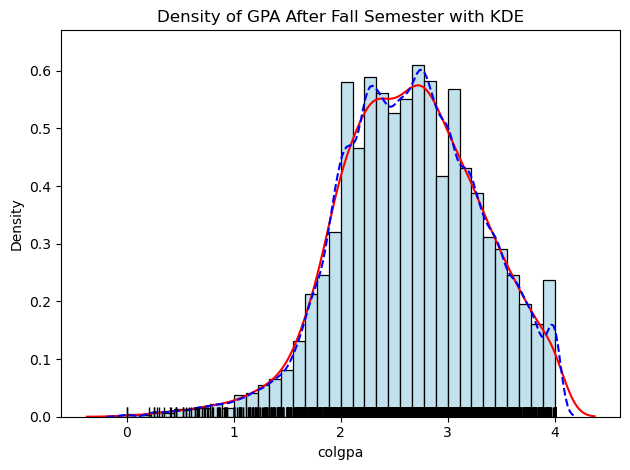

In [6]:
plot_density(gpa2['colgpa'], 'GPA After Fall Semester')

- Slightly left-skewed, concentrated around 2.5 to 3.
- More students with high GPA than low GPA.
- Expect to approximate a normal distribution, if not constrained at 4.
- There seems to be a small number of students with 0 GPA. We don't know if they are missing values inputted as 0, or outliers.

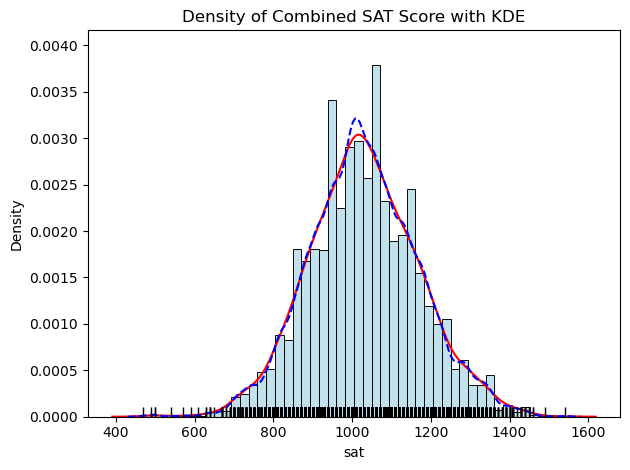

In [7]:
plot_density(gpa2['sat'], 'Combined SAT Score')

- Appears normally distributed, peaking around 900 to 1100.
- Most students have mid-range SAT scores, with fewer at the extremes.

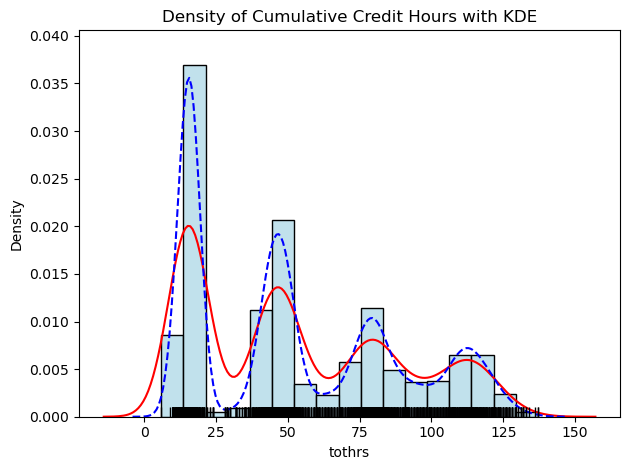

In [8]:
plot_density(gpa2['tothrs'], 'Cumulative Credit Hours')

- Right skewed, most students have lower total hours completed.
- The histogram shape suggests that the metric reflects different grade levels of students, with newer students with less cumulative credit hours, and older students with higher cumulative credit hours.
- Multiple modes and increasing variance in cumulative credit hours, which is expected from our interpretation.

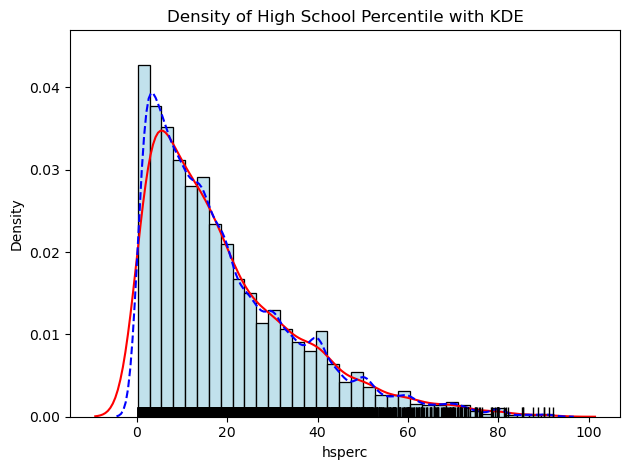

In [9]:
plot_density(gpa2['hsperc'], 'High School Percentile')

- Appears to follow a roughly exponential distribution, where the density of students decreases as the high school percentile increases.
- More students fall into the higher percentiles, with fewer in the lower percentiles.
- This is expected as students who do well in high school (top x %) are more likely to attend college.

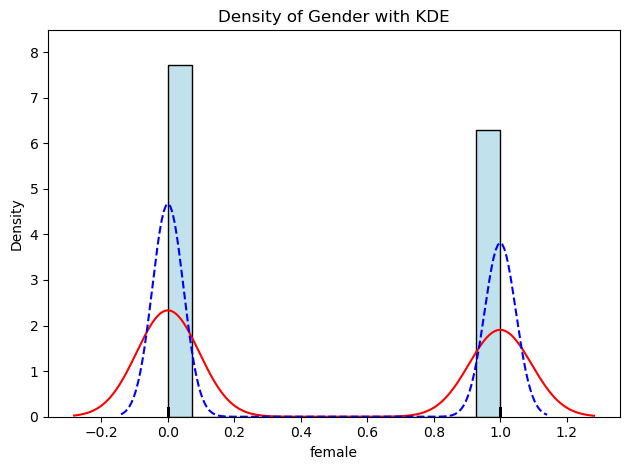

In [10]:
plot_density(gpa2['female'], 'Gender')

- The split is not completely equal, but close enough.

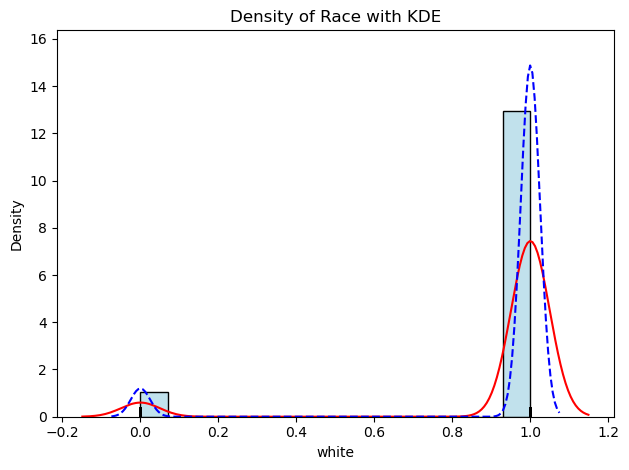

In [11]:
plot_density(gpa2['white'], 'Race')

- The majority of students in the sample are white.

In [12]:
# Credit: Joshua O.
def plot_qq(data, title, dist='norm'):
    # Generate QQ plot for a given distribution.
    sm.qqplot(data, line='s')
    plt.title(f'QQ Plot of {title} for {dist.capitalize()} Distribution')
    plt.show()

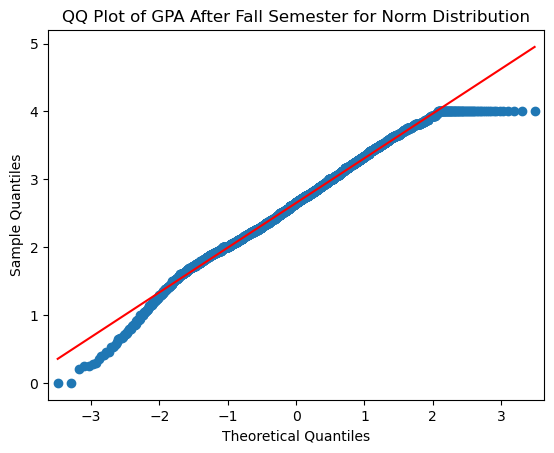

In [13]:
plot_qq(gpa2['colgpa'], 'GPA After Fall Semester')

- **colgpa**: The points deviate slightly from the straight line, especially in right. However, we see a relatively normal distribution in the middle. The flattening out is due to the artificial constraint at 4. Also, the two 0 values stand out as outliers.

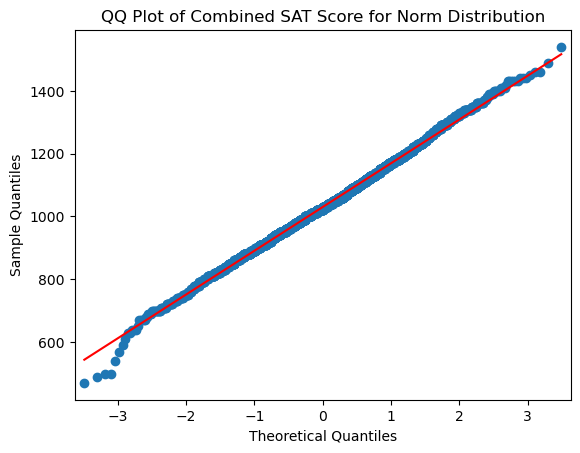

In [14]:
plot_qq(gpa2['sat'], 'Combined SAT Score')

- **sat**: The points are relatively close to the line, indicating that sat scores follow a normal distribution; consistent with our histogram. 

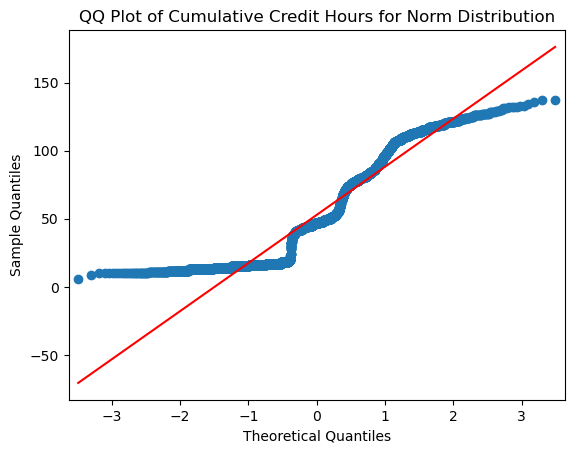

In [15]:
plot_qq(gpa2['tothrs'], 'Cumulative Credit Hours')

- **tothrs**: The points significantly deviate from the straight line. From the QQ plot and the histogram, we hypothesize that tothrs do not follow a normal distribution.

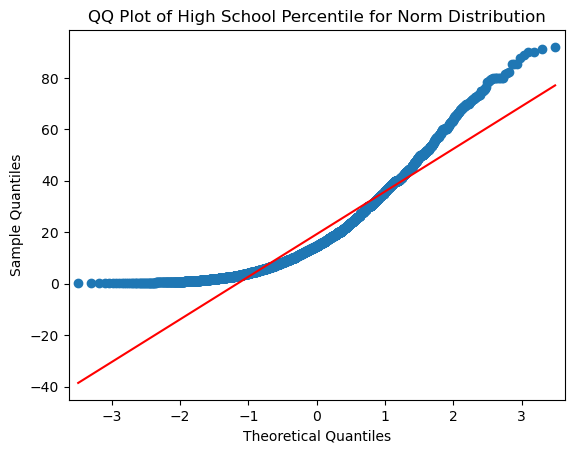

In [16]:
plot_qq(gpa2['hsperc'], 'High School Percentile')

- **hsperc**: hsperc also doesn't seem to follow a normal distribution.

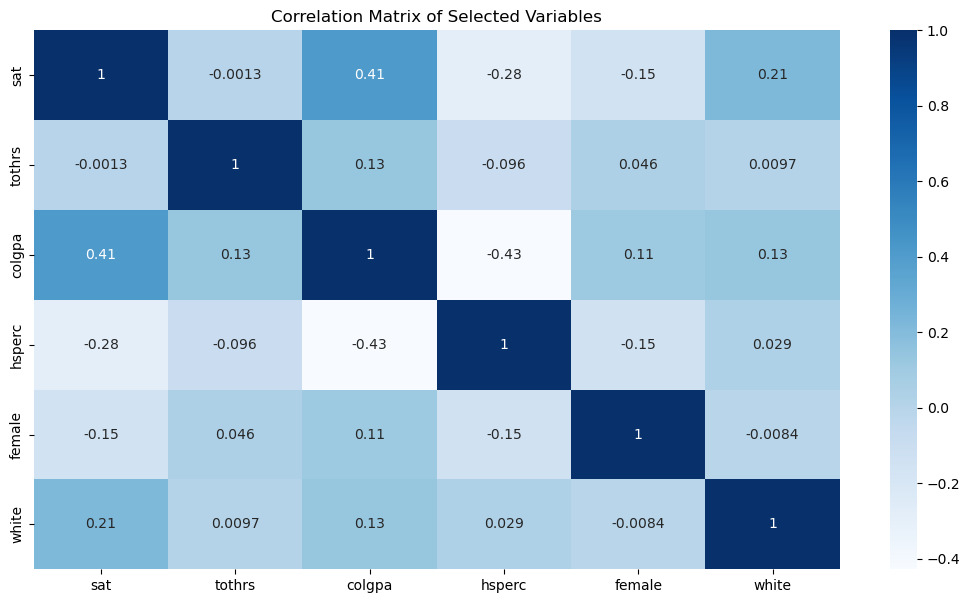

In [17]:
# Correlation Matrix
plt.figure(figsize=(13,7))
c=gpa2[['sat', 'tothrs', 'colgpa', 'hsperc', 'female', 'white']].corr()
sns.heatmap(c,annot=True, cmap="Blues")
plt.title('Correlation Matrix of Selected Variables')
plt.show()

- **Correlation among independent variables are low, so there is no multicollinearity. However, because we are only considering univariate models, this is not important.**
- **The two variables with highest correlation with colgpa are hsperc and sat.**
- sat and College GPA (colgpa): There is a moderate positive correlation (0.41) between SAT scores and college GPA, suggesting that higher SAT scores are associated with higher college GPAs.
- tothrs (total hours) and College GPA: The correlation is weak (0.13), indicating a slight positive association between total hours and college GPA.
- hsperc (high school percentile) and College GPA: There is a moderate negative correlation (-0.43), implying that students ranked higher (lower percentile) in high school tend to have higher GPAs in college.
- Gender (female) and College GPA: A weak positive correlation (0.11) exists between being female and having a higher GPA.
- Race (white) and College GPA: The correlation between being white and college GPA is weak (0.13).

In [18]:
# Credit: Joshua O.
def plot_box(dataframe, column_name, title):
    # Generate box plots that compares distribution
    # Takes account of female and white dummy variables
    sns.boxplot(data=dataframe, x='female', y=column_name, hue='white')
    plt.title(f'Box Plot of {title} by Gender and Race')
    plt.show()

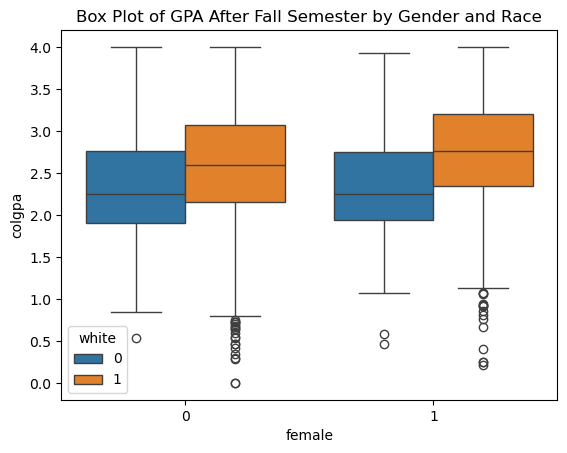

In [19]:
plot_box(gpa2, 'colgpa', 'GPA After Fall Semester')

There seems to be a much more significant difference in avergae GPA across races than across genders, with GPA being, on average, higher for white students than non-white students. However, this may not be statistically significant due to overlap of the boxplots across all four sub-groups.

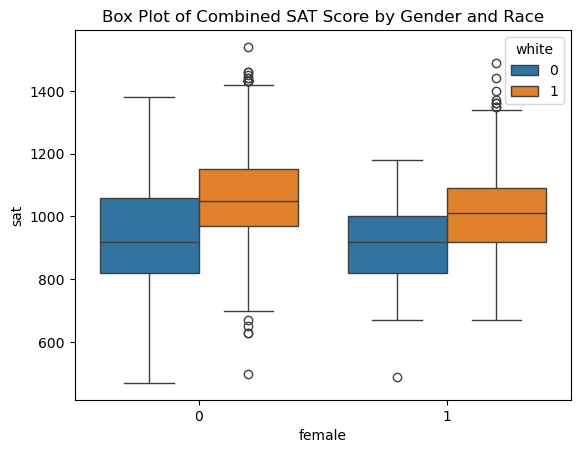

In [20]:
plot_box(gpa2, 'sat', 'Combined SAT Score')

We see the same trend as the boxplot for GPA. However, we see a larger range for male students than female students.

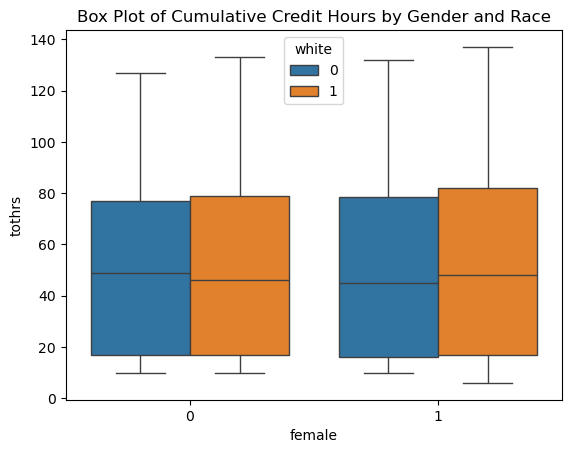

In [21]:
plot_box(gpa2, 'tothrs', 'Cumulative Credit Hours')

There is not that much of a difference between the distribution of cumulative credit hours. This is expected since all students take similar courseload throughout college.

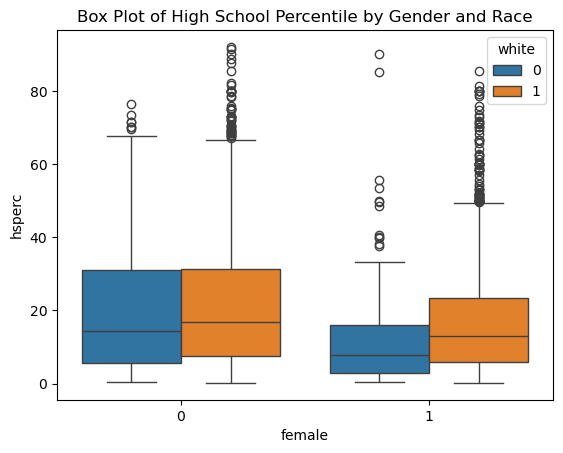

In [22]:
plot_box(gpa2, 'hsperc', 'High School Percentile')

The high school percentile (from top) are condensed in the lower values (higher rankings). On average, female students seem to have ranked higher in high school (lower values). White female students ranks higher than non-white female students. 

### 1b. Exploratory Data Analysis (EDA)

In [23]:
# !pip install ydata_profiling
from ydata_profiling import ProfileReport
ProfileReport(gpa2)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

We covered most of the findings in Pandas Profiling through manual descriptive analysis. Both results were consistent.

### 1c. Density Estimations

#### Cullen-Frey Plot of colgpa

summary statistics
------
min:  0   max:  4 
median:  2.66 
mean:  2.652686 
estimated sd:  0.6586347 
estimated skewness:  -0.2147451 
estimated kurtosis:  3.113795 


要求されたパッケージ MASS をロード中です
要求されたパッケージ survival をロード中です


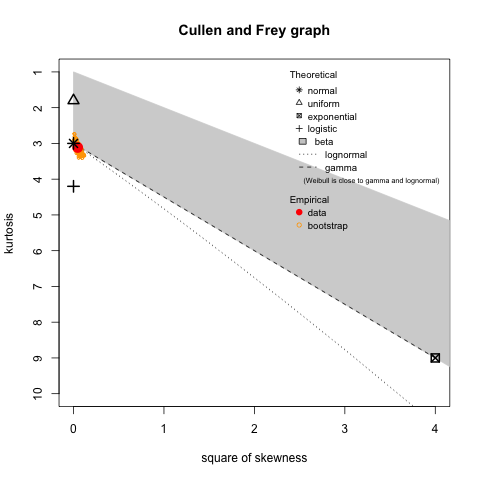

In [24]:
%%R -i gpa2
set.seed(10)  # for bootstrap
library("fitdistrplus")

# Cullen-Frey Graph for the 'colgpa' column of the 'gpa2' dataframe
descdist(gpa2$colgpa, boot = 1000)

According to the plot, the best fitting distribution appears to be normal for college GPA. The bootstrap estimations are close to the data point, which indicate symmetric data.

#### Cullen-Frey Plot of sat

summary statistics
------
min:  470   max:  1540 
median:  1030 
mean:  1030.331 
estimated sd:  139.4014 
estimated skewness:  0.07336133 
estimated kurtosis:  3.187166 


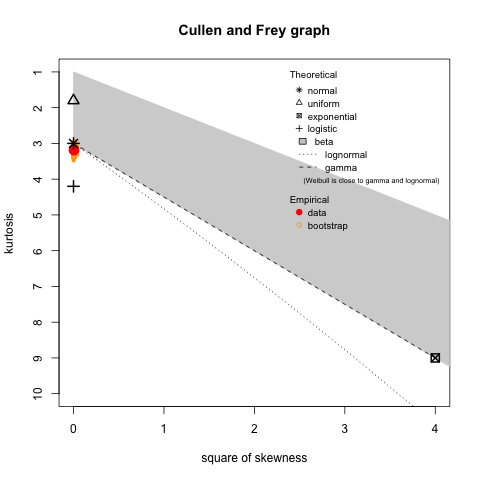

In [25]:
%%R -i gpa2
set.seed(10)  # for bootstrap
library("fitdistrplus")

# Cullen-Frey Graph for the 'sat' column of the 'gpa2' dataframe
descdist(gpa2$sat, boot = 1000)

Similar to collge GPA, the plot shows that SAT scores also have a normal distribution and symmetric data.

#### Cullen-Frey Plot of tothrs

summary statistics
------
min:  6   max:  137 
median:  47 
mean:  52.83225 
estimated sd:  35.32959 
estimated skewness:  0.4966427 
estimated kurtosis:  2.000972 


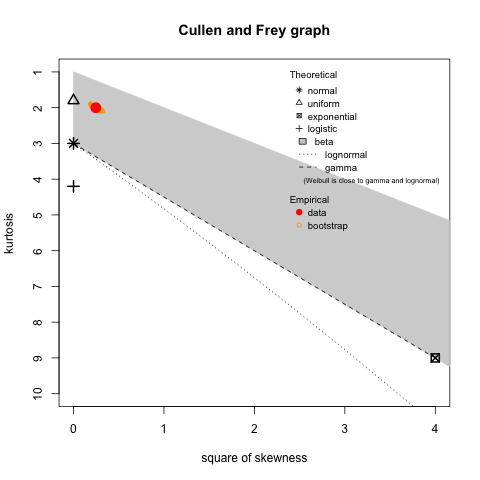

In [26]:
%%R -i gpa2
set.seed(10)  # for bootstrap
library("fitdistrplus")

# Cullen-Frey Graph for the 'tothrs' column of the 'gpa2' dataframe
descdist(gpa2$tothrs, boot = 1000)

The cumulative credit hours is closest to a uniform distribution. Looking at the histograms, this result makes sense. The bootstrap are also overlapped, which is consistent to the multiple modes shown in the histogram.

#### Cullen-Frey Plot of hsperc

summary statistics
------
min:  0.1666667   max:  92 
median:  14.58333 
mean:  19.23707 
estimated sd:  16.56873 
estimated skewness:  1.292299 
estimated kurtosis:  4.534076 


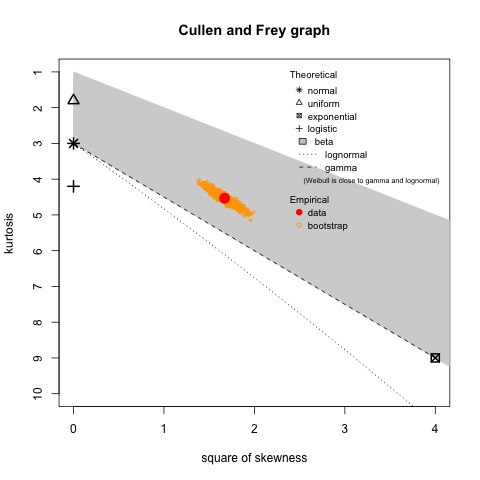

In [27]:
%%R -i gpa2
set.seed(10)  # for bootstrap
library("fitdistrplus")

# Cullen-Frey Graph for the 'hsperc' column of the 'gpa2' dataframe
descdist(gpa2$hsperc, boot = 1000)

The distribution of high school percentile is closest to the gamma distribution. The large spread in bootstrap indicate a non-symetric and/or highly variable data, which is consistent to the histogram (heavily skewed to the right).

#### Fitter Method for colgpa

The fitter method used below for our variables uses Python instead of R. It tests for more types of distributions, but we will not rely too much on these results, beacuse we want to avoid overfitting. If we were to select the best distribution from the output, we look for the distribution with the lowest aic values.

2024-10-25 14:52:03.336 | WARNING  | fitter.fitter:_fit_single_distribution:337 - SKIPPED _fit distribution (taking more than 30 seconds)
2024-10-25 14:52:03.362 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted anglit distribution with error=3.3509)
2024-10-25 14:52:03.366 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted bradford distribution with error=5.481854)
2024-10-25 14:52:03.369 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted arcsine distribution with error=7.088828)
2024-10-25 14:52:03.383 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted argus distribution with error=2.542545)
2024-10-25 14:52:03.389 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted beta distribution with error=1.051435)
2024-10-25 14:52:03.426 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted alpha distribution with error=0.966217)
2024-10-25 14:52:03.443 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fit

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
recipinvgauss,0.949600,557.635790,576.618968,inf,0.028531,0.002330
invgamma,0.956477,567.473941,586.457119,inf,0.028619,0.002235
erlang,0.962133,529.613637,548.596815,inf,0.023927,0.017249
nct,0.963365,529.903024,555.213929,inf,0.023695,0.018906
gamma,0.964223,532.937485,551.920664,inf,0.023430,0.020969


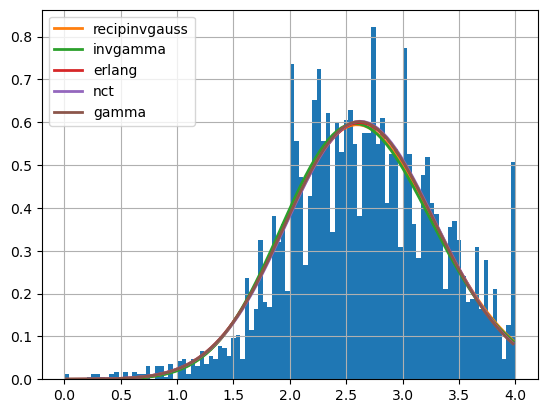

In [110]:
# Find the best distribution for colgpa
gpa2 = pd.DataFrame(woo.data('gpa2'))
colgpa_fit = Fitter(gpa2['colgpa'])
colgpa_fit.fit()

colgpa_fit.summary()

#### Fitter Method for sat

2024-10-25 13:47:53.513 | WARNING  | fitter.fitter:_fit_single_distribution:337 - SKIPPED _fit distribution (taking more than 30 seconds)
2024-10-25 13:47:53.569 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted arcsine distribution with error=0.00017)
2024-10-25 13:47:53.572 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted anglit distribution with error=5.8e-05)
2024-10-25 13:47:53.587 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted bradford distribution with error=0.000125)
2024-10-25 13:47:53.602 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted cauchy distribution with error=2.5e-05)
2024-10-25 13:47:53.607 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted alpha distribution with error=1.1e-05)
2024-10-25 13:47:53.614 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted argus distribution with error=8.3e-05)
2024-10-25 13:47:53.648 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitt

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
genhyperbolic,0.000011,1658.210159,1689.848789,inf,0.023118,0.023644
norminvgauss,0.000011,1656.631242,1681.942147,inf,0.023918,0.017309
johnsonsu,0.000011,1656.848991,1682.159896,inf,0.024143,0.015828
fatiguelife,0.000011,1708.598571,1727.581750,inf,0.026532,0.005801
skewnorm,0.000011,1677.043164,1696.026342,inf,0.026305,0.006408


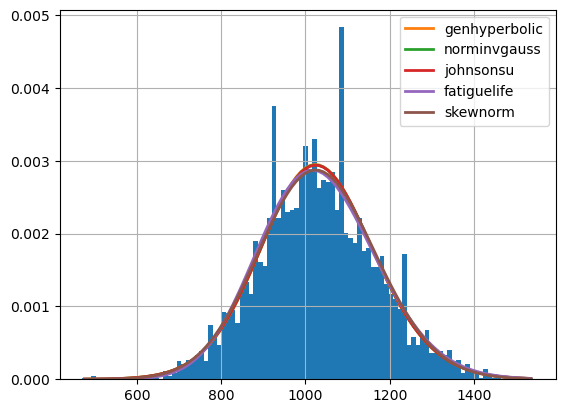

In [29]:
# Find the best distribution for sat
gpa2 = pd.DataFrame(woo.data('gpa2'))
sat_fit = Fitter(gpa2['sat'])
sat_fit.fit()

sat_fit.summary()

#### Fitter Method for tothrs

2024-10-25 13:48:56.671 | WARNING  | fitter.fitter:_fit_single_distribution:337 - SKIPPED _fit distribution (taking more than 30 seconds)
2024-10-25 13:48:56.718 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted anglit distribution with error=0.013573)
2024-10-25 13:48:56.764 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted argus distribution with error=0.014851)
2024-10-25 13:48:56.769 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted arcsine distribution with error=0.016447)
2024-10-25 13:48:56.782 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted cauchy distribution with error=0.013989)
2024-10-25 13:48:56.826 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted alpha distribution with error=0.011106)
2024-10-25 13:48:56.872 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted chi2 distribution with error=0.06514)
2024-10-25 13:48:56.878 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitt

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
genhyperbolic,0.007812,1086.154074,1117.792705,inf,0.176585,2.612932e-113
exponnorm,0.010614,1079.448578,1098.431757,inf,0.186132,6.093560e-126
levy,0.010714,1144.094858,1156.750310,inf,0.308569,0.000000e+00
johnsonsu,0.010815,1117.642021,1142.952925,inf,0.184694,5.382104e-124
fatiguelife,0.010952,1080.881995,1099.865174,inf,0.172643,2.713655e-108


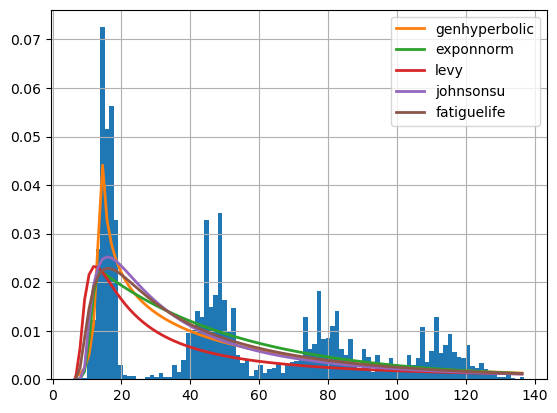

In [30]:
# Find the best distribution for tothrs
gpa2 = pd.DataFrame(woo.data('gpa2'))
tothrs_fit = Fitter(gpa2['tothrs'])
tothrs_fit.fit()

tothrs_fit.summary()

#### Fitter Method for hsperc

2024-10-25 13:50:09.867 | WARNING  | fitter.fitter:_fit_single_distribution:337 - SKIPPED _fit distribution (taking more than 30 seconds)
2024-10-25 13:50:10.034 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted anglit distribution with error=0.013248)
2024-10-25 13:50:10.038 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted arcsine distribution with error=0.015182)
2024-10-25 13:50:10.056 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted cauchy distribution with error=0.005508)
2024-10-25 13:50:10.067 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted bradford distribution with error=0.007158)
2024-10-25 13:50:10.218 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted alpha distribution with error=0.002575)
2024-10-25 13:50:10.253 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted chi distribution with error=0.000786)
2024-10-25 13:50:10.282 | INFO     | fitter.fitter:_fit_single_distribution:333 - F

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
beta,0.000500,1101.236793,1126.547697,inf,0.015496,0.270755
genexpon,0.000508,1101.800473,1133.439104,inf,0.014106,0.379276
gompertz,0.000511,1097.241172,1116.224350,inf,0.017472,0.158061
genpareto,0.000512,1097.553444,1116.536623,inf,0.016919,0.184986
gengamma,0.000517,1097.875401,1123.186306,inf,0.013947,0.393180


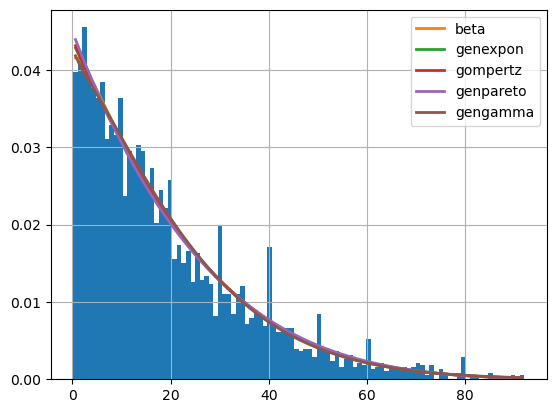

In [31]:
# Find the best distribution for hsperc
gpa2 = pd.DataFrame(woo.data('gpa2'))
hsperc_fit = Fitter(gpa2['hsperc'])
hsperc_fit.fit()

hsperc_fit.summary()

### 1d. Non-linearity and Variable Transformations

#### Scatterplot of non-indicator variables

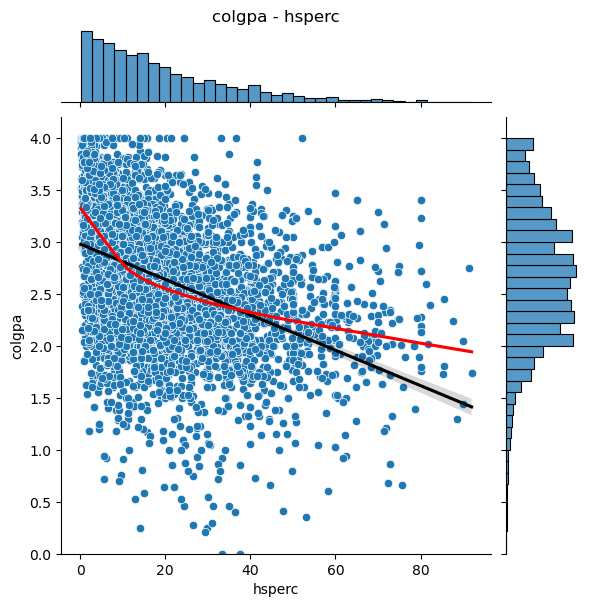

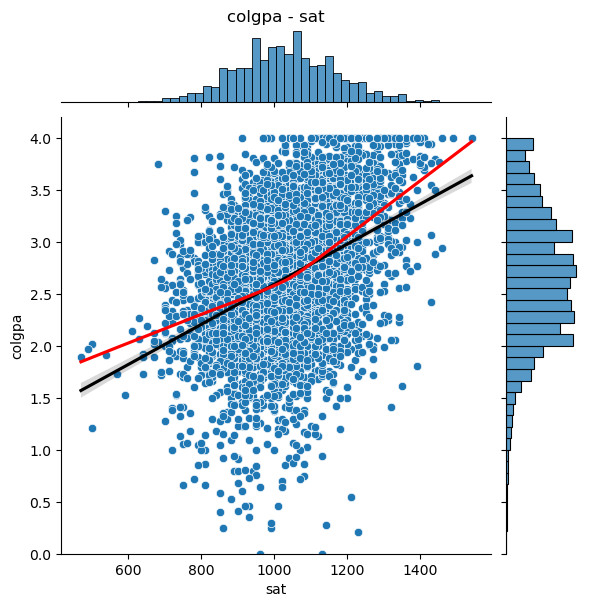

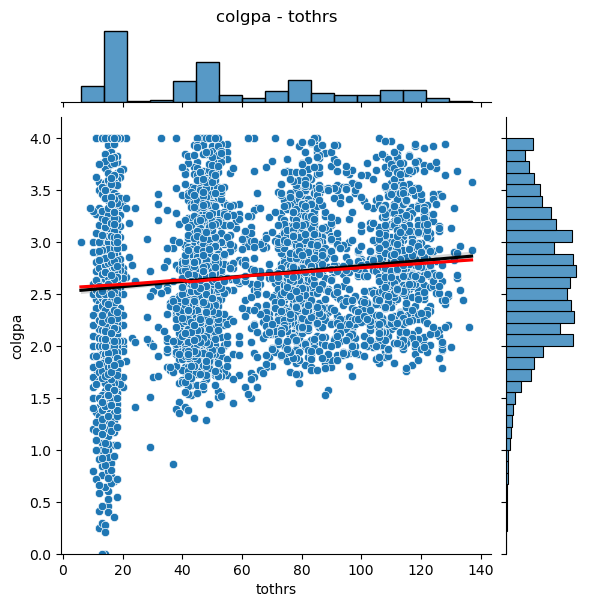

In [32]:
# Plotting colgpa vs hsperc
t0 = sns.jointplot(data=gpa2, x='hsperc', y='colgpa')
t0.plot_joint(sns.scatterplot)
t0.plot_joint(sns.regplot, fit_reg=True, scatter=False, color='black')
t0.plot_joint(sns.regplot, lowess=True, scatter=False, color='red')
plt.ylim((0,None))
plt.title('colgpa - hsperc', y=1.2)
plt.show()

# Plotting colgpa vs sat
t1 = sns.jointplot(data=gpa2, x='sat', y='colgpa')
t1.plot_joint(sns.scatterplot)
t1.plot_joint(sns.regplot, fit_reg=True, scatter=False, color='black')
t1.plot_joint(sns.regplot, lowess=True, scatter=False, color='red')
plt.ylim((0,None))
plt.title('colgpa - sat', y=1.2)
plt.show()

# Plotting colgpa vs tothrs
t2 = sns.jointplot(data=gpa2, x='tothrs', y='colgpa')
t2.plot_joint(sns.scatterplot)
t2.plot_joint(sns.regplot, fit_reg=True, scatter=False, color='black')
t2.plot_joint(sns.regplot, lowess=True, scatter=False, color='red')
plt.ylim((0,None))
plt.title('colgpa - tothrs', y=1.2)
plt.show()

The black line is the standrad linear regression line, and the red line is the lowess (Locally Weighted Scatterplot Smoothing) regression line. The more the lowess line deviates from the standard regression, the more the relationship between the variables deviates from the perfectly linear relationship. Out of the 3 variables, tothrs seems to follow a linear relationship the most, but we do not expect this to be one of the best predictors of college GPA due to its high heteroskedasticity. Further, we don't expect students' GPA to increase as they take more credit hours.

### Consider Box-cox transformations for hsperc

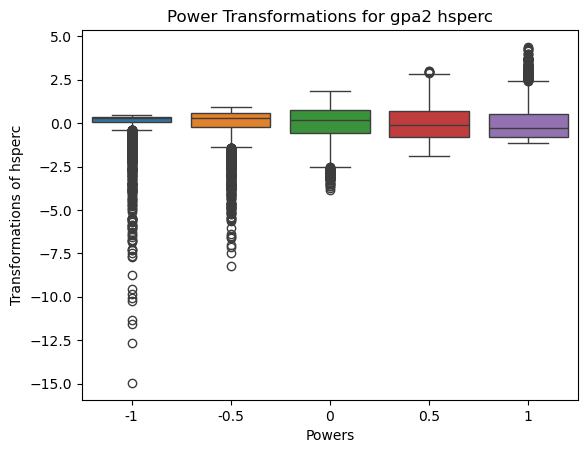

In [33]:
#Box-cox lambda estimates for hsperc
un_boxcox = pd.DataFrame({
    '-1':stats.boxcox(gpa2['hsperc'], lmbda=-1),
    '-0.5':stats.boxcox(gpa2['hsperc'], lmbda=-0.5),
    '0':stats.boxcox(gpa2['hsperc'], lmbda=0),
    '0.5':stats.boxcox(gpa2['hsperc'], lmbda=0.5),
    '1':stats.boxcox(gpa2['hsperc'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(un_boxcox)
plt.ylabel('Transformations of hsperc')
plt.xlabel('Powers')
plt.title('Power Transformations for gpa2 hsperc')
plt.show()

In [34]:
# Testing the power transformations
_, hsperc_lambda, hsperc_ci = stats.boxcox(gpa2.hsperc, alpha=0.05)

# Print optimal results
print(f'estimated power = {hsperc_lambda:.4}\n' + f'rounded power = {np.round(hsperc_lambda,1)}\n' +
      f'Confidence interval = {np.round(hsperc_ci, 4)}')

# Compute log-likelihoods
hsperc_Lopt_ll = stats.boxcox_llf(lmb=hsperc_lambda, data=gpa2.hsperc) # optimal lambda
hsperc_L0_ll = stats.boxcox_llf(lmb=0, data=gpa2.hsperc) # lambda = 0
hsperc_L05_ll = stats.boxcox_llf(lmb=0.5, data=gpa2.hsperc) # lambda = 0.5
hsperc_L1_ll = stats.boxcox_llf(lmb=1, data=gpa2.hsperc) # lambda = 1
hsperc_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
hsperc_L0_stat = 2 * (hsperc_Lopt_ll - hsperc_L0_ll)
hsperc_L05_stat = 2 * (hsperc_Lopt_ll - hsperc_L05_ll)
hsperc_L1_stat = 2 * (hsperc_Lopt_ll - hsperc_L1_ll)
hsperc_test_stat = [hsperc_L0_stat, hsperc_L05_stat, hsperc_L1_stat] # combine into one list

# Compute p-values
hsperc_L0_p = 1 - stats.chi2.cdf(hsperc_L0_stat, df=1)
hsperc_L05_p = 1 - stats.chi2.cdf(hsperc_L05_stat, df=1)
hsperc_L1_p = 1 - stats.chi2.cdf(hsperc_L1_stat, df=1)
hsperc_test_p = [hsperc_L0_p, hsperc_L05_p, hsperc_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(hsperc_test_lambda, hsperc_test_stat, hsperc_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = 0.2945
rounded power = 0.3
Confidence interval = [0.2685 0.3207]

Lambda 	 Test Stat 	 p-value
0 	 538.252 	 0.0
0.5 	 223.939 	 0.0
1 	 2270.75 	 0.0


From the box plot, we hypothesized the ideal value of lambda for the box-cox transformation for hsperc to be between 0 and 0.5. Our hypothesis was substantiated by the result of the test. Since it is roughly in the midpoint of the two values, we will model with both powers.

### Consider Box-Cox transformation for sat

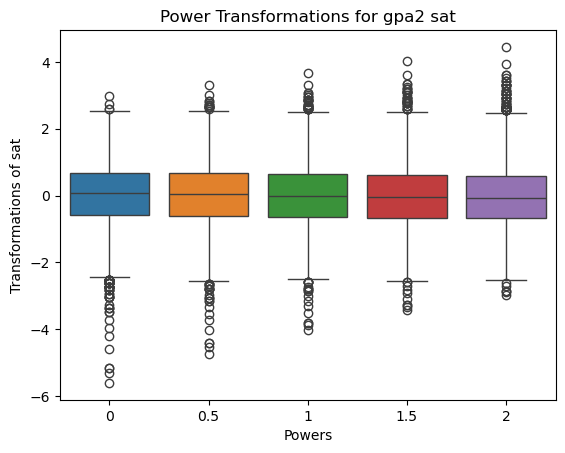

In [35]:
#Box-cox lambda estimates for sat
un_boxcox = pd.DataFrame({
    '0':stats.boxcox(gpa2['sat'], lmbda=0),
    '0.5':stats.boxcox(gpa2['sat'], lmbda=0.5),
    '1':stats.boxcox(gpa2['sat'], lmbda=1),
    '1.5':stats.boxcox(gpa2['sat'], lmbda=1.5),
    '2':stats.boxcox(gpa2['sat'], lmbda=2)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(un_boxcox)
plt.ylabel('Transformations of sat')
plt.xlabel('Powers')
plt.title('Power Transformations for gpa2 sat')
plt.show()

In [36]:
# Testing the power transformations
_, sat_lambda, sat_ci = stats.boxcox(gpa2.sat, alpha=0.05)

# Print optimal results
print(f'estimated power = {sat_lambda:.4}\n' + f'rounded power = {np.round(sat_lambda,1)}\n' +
      f'Confidence interval = {np.round(sat_ci, 4)}')

# Compute log-likelihoods
sat_Lopt_ll = stats.boxcox_llf(lmb=sat_lambda, data=gpa2.sat) # optimal lambda
sat_L0_ll = stats.boxcox_llf(lmb=0, data=gpa2.sat) # lambda = 0
sat_L05_ll = stats.boxcox_llf(lmb=0.5, data=gpa2.sat) # lambda = 0.5
sat_L1_ll = stats.boxcox_llf(lmb=1, data=gpa2.sat) # lambda = 1
sat_L1_5_ll = stats.boxcox_llf(lmb=1.5, data=gpa2.sat) # lambda = 1.5
sat_L2_ll = stats.boxcox_llf(lmb=2, data=gpa2.sat) # lambda = 2

sat_test_lambda = [0, 0.5, 1, 1.5, 2] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
sat_L0_stat = 2 * (sat_Lopt_ll - sat_L0_ll)
sat_L05_stat = 2 * (sat_Lopt_ll - sat_L05_ll)
sat_L1_stat = 2 * (sat_Lopt_ll - sat_L1_ll)
sat_L1_5_stat = 2 * (sat_Lopt_ll - sat_L1_5_ll)
sat_L2_stat = 2 * (sat_Lopt_ll - sat_L2_ll)
sat_test_stat = [sat_L0_stat, sat_L05_stat, sat_L1_stat, sat_L1_5_stat, sat_L2_stat] # combine into one list

# Compute p-values
sat_L0_p = 1 - stats.chi2.cdf(sat_L0_stat, df=1)
sat_L05_p = 1 - stats.chi2.cdf(sat_L05_stat, df=1)
sat_L1_p = 1 - stats.chi2.cdf(sat_L1_stat, df=1)
sat_L1_5_p = 1 - stats.chi2.cdf(sat_L1_5_stat, df=1)
sat_L2_p = 1 - stats.chi2.cdf(sat_L2_stat, df=1)
sat_test_p = [sat_L0_p, sat_L05_p, sat_L1_p, sat_L1_5_p, sat_L2_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(sat_test_lambda, sat_test_stat, sat_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = 0.8633
rounded power = 0.9
Confidence interval = [0.6934 1.0348]

Lambda 	 Test Stat 	 p-value
0 	 103.019 	 0.0
0.5 	 17.7317 	 2.544e-05
1 	 2.44405 	 0.118
1.5 	 51.8137 	 6.102e-13
2 	 161.631 	 0.0


From the box plot, we hypothesized the ideal value of lambda for the box-cox transformation for sat to be around 1. Our hypothesis was consistent with the test result. Thus, we won't conduct a box-cox transformation of this variable.

### Consider Box-Cox Transformation for colgpa

To conduct the box-cox test, the varible cannot take on 0 values. As we outlined earlier, there are 2 zero GPA students in the dataset, which are likely to be outliers or imputed values. Since the total sample size is over 4000, we determined that removing them would not significantly impact the analysis.

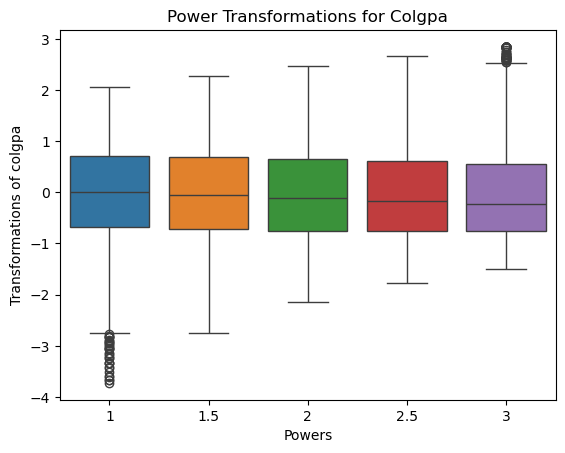

In [39]:
# Remove rows where 'colgpa' is 0
gpa2_dropped = gpa2[gpa2['colgpa'] != 0]

# Create a DataFrame with transformed data using different Box-Cox transformations
transformed_data = pd.DataFrame({
    '1': stats.boxcox(gpa2_dropped['colgpa'], lmbda=1),
    '1.5': stats.boxcox(gpa2_dropped['colgpa'], lmbda=1.5),
    '2': stats.boxcox(gpa2_dropped['colgpa'], lmbda=2),
    '2.5': stats.boxcox(gpa2_dropped['colgpa'], lmbda=2.5),
    '3': stats.boxcox(gpa2_dropped['colgpa'], lmbda=3)
})

# Center and scale the transformed data
transformed_data_scaled = transformed_data.apply(preprocessing.scale, axis=0)

# Plot the boxplot for the transformed data
sns.boxplot(data=transformed_data_scaled)
plt.ylabel('Transformations of colgpa')
plt.xlabel('Powers')
plt.title('Power Transformations for Colgpa')
plt.show()

In [40]:
# Testing the power transformations
_, colgpa_lambda, colgpa_ci = stats.boxcox(gpa2_dropped.colgpa, alpha=0.05)

# Print optimal results
print(f'estimated power = {colgpa_lambda:.4f}\n' +
      f'rounded power = {np.round(colgpa_lambda, 1)}\n' +
      f'Confidence interval = {np.round(colgpa_ci, 4)}')

# Compute log-likelihoods
colgpa_Lopt_ll = stats.boxcox_llf(lmb=colgpa_lambda, data=gpa2_dropped.colgpa)  # optimal lambda
colgpa_L0_ll = stats.boxcox_llf(lmb=0, data=gpa2_dropped.colgpa)  # lambda = 0
colgpa_L05_ll = stats.boxcox_llf(lmb=0.5, data=gpa2_dropped.colgpa)  # lambda = 0.5
colgpa_L1_ll = stats.boxcox_llf(lmb=1, data=gpa2_dropped.colgpa)  # lambda = 1
colgpa_L1_5_ll = stats.boxcox_llf(lmb=1.5, data=gpa2_dropped.colgpa)  # lambda = 1.5
colgpa_L2_ll = stats.boxcox_llf(lmb=2, data=gpa2_dropped.colgpa)  # lambda = 2

colgpa_test_lambda = [0, 0.5, 1, 1.5, 2]  # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
colgpa_L0_stat = 2 * (colgpa_Lopt_ll - colgpa_L0_ll)
colgpa_L05_stat = 2 * (colgpa_Lopt_ll - colgpa_L05_ll)
colgpa_L1_stat = 2 * (colgpa_Lopt_ll - colgpa_L1_ll)
colgpa_L1_5_stat = 2 * (colgpa_Lopt_ll - colgpa_L1_5_ll)
colgpa_L2_stat = 2 * (colgpa_Lopt_ll - colgpa_L2_ll)
colgpa_test_stat = [colgpa_L0_stat, colgpa_L05_stat, colgpa_L1_stat, colgpa_L1_5_stat, colgpa_L2_stat]  # combine into one list

# Compute p-values
colgpa_L0_p = 1 - stats.chi2.cdf(colgpa_L0_stat, df=1)
colgpa_L05_p = 1 - stats.chi2.cdf(colgpa_L05_stat, df=1)
colgpa_L1_p = 1 - stats.chi2.cdf(colgpa_L1_stat, df=1)
colgpa_L1_5_p = 1 - stats.chi2.cdf(colgpa_L1_5_stat, df=1)
colgpa_L2_p = 1 - stats.chi2.cdf(colgpa_L2_stat, df=1)
colgpa_test_p = [colgpa_L0_p, colgpa_L05_p, colgpa_L1_p, colgpa_L1_5_p, colgpa_L2_p]  # combine into one list

# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(colgpa_test_lambda, colgpa_test_stat, colgpa_test_p):
    print(f'{p[0]} \t {p[1]:.6f} \t {p[2]:.4f}')

estimated power = 1.2129
rounded power = 1.2
Confidence interval = [1.1255 1.3021]

Lambda 	 Test Stat 	 p-value
0 	 1072.382017 	 0.0000
0.5 	 306.671304 	 0.0000
1 	 23.564072 	 0.0000
1.5 	 38.073132 	 0.0000
2 	 259.485163 	 0.0000


From the box plot, we hypothesized the ideal value of lambda for the box-cox transformation for sat to be between 1.5 and 2.5. However, the test result was 1.2. We will round this result to 1, and not transform the variable.

### 1e. + 1f. Unusual Features and N/As

Our reasoning is explained in the Box-Cox test section.

## 2. Variable Selection

### 2a. Boruta Algorithm

In [41]:
gpa2 = pd.DataFrame(woo.data('gpa2'))
gpa2['hsperc_sqrt'] = np.sqrt(gpa2['hsperc'])
X = gpa2[['sat', 'tothrs', 'white', 'hsperc', 'female', 'hsperc_sqrt']]  # Independent variables
y = gpa2['colgpa']  # Dependent variable

np.int = np.int32
np.float = np.float64
np.bool = np.bool_

rf = RandomForestRegressor(max_depth=5)
boruta = BorutaPy(rf, n_estimators='auto', verbose=2, random_state=10, two_step=True)

boruta.fit(X, y)

selected_features = X.columns[boruta.support_]
print(f"Top predictors selected by Boruta: {list(selected_features)}")

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	6
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	6
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	6
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	6
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	6
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	6
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	6
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	5
Tentative: 	0
Rejected: 	1


BorutaPy finished running.

Iteration: 	9 / 100
Confirmed: 	5
Tentative: 	0
Rejected: 	1
Top predictors selected by Boruta: ['sat', 'tothrs', 'white', 'hsperc', 'hsperc_sqrt']


According to BorutaPy, gender was not the best predictor for college GPA.

        meanImp medianImp    minImp    maxImp normHits  decision
female 11.69088  12.41940  8.812752  13.95965        1 Confirmed
hsperc 98.20322  98.38250 91.893402 101.48160        1 Confirmed
white  28.13020  27.72032 26.522673  31.59030        1 Confirmed
tothrs 26.42134  25.74202 23.572954  31.18192        1 Confirmed
sat    58.83278  58.49178 55.242056  64.53990        1 Confirmed


 1. run of importance source...
 2. run of importance source...
 3. run of importance source...
 4. run of importance source...
 5. run of importance source...
 6. run of importance source...
 7. run of importance source...
 8. run of importance source...
 9. run of importance source...
After 9 iterations, +12 secs: 
 confirmed 5 attributes: female, hsperc, sat, tothrs, white;
 no more attributes left.



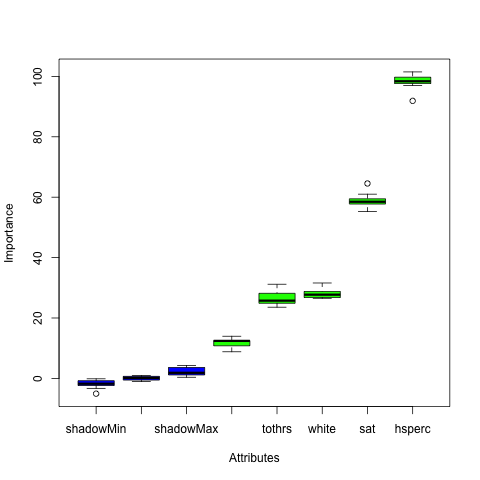

In [42]:
%%R -i gpa2
library(Boruta)

# This is the preferred version
gpa2$hsperc_sqrt <- sqrt(gpa2$hsperc)
set.seed(123) # for reproducibility in bootstrap
gpa2_boruta <- Boruta(colgpa ~ sat + tothrs + white + hsperc + female, data = gpa2, doTrace = 2)

plot(gpa2_boruta, sort = TRUE)
attStats(gpa2_boruta)

From the graph, it is clear that the 2 best predictors for college GPA from the Boruta Algorithm are, in order, hsperc and sat.

### 3b. Mallows $C_p$

In [43]:
# Add a constant to X for intercept in the model
X = gpa2[['sat', 'tothrs', 'white', 'hsperc', 'female', 'hsperc_sqrt']]  # Independent variables
X = sm.add_constant(X)

# Fit the full model and get the RSS for Mallows' Cp calculation
full_model = sm.OLS(y, X).fit()
full_rss = full_model.ssr  # Residual sum of squares of the full model
n = len(y)  # Number of observations
p_full = full_model.df_model + 1  # Number of predictors in the full model

# Function to calculate Mallows' Cp
def calculate_mallows_cp(subset, X, y, full_rss, p_full):
    # Fit the OLS model for the subset of predictors
    X_subset = X[list(subset)]
    model = sm.OLS(y, X_subset).fit()

    # Calculate RSS and number of predictors in the subset model
    rss_subset = model.ssr
    p_subset = model.df_model + 1

    # Calculate Mallows' Cp
    cp = (rss_subset / (full_rss / (n - p_full))) - (n - 2 * p_subset)
    return cp

# Get all possible combinations of predictors
predictors = X.columns[1:]  # Exclude the constant term
combinations_of_predictors = [combo for i in range(1, len(predictors) + 1) for combo in combinations(predictors, i)]

# Calculate Mallows' Cp for each combination
mallows_cp_results = []
for combo in combinations_of_predictors:
    cp = calculate_mallows_cp(combo, X, y, full_rss, p_full)
    mallows_cp_results.append((combo, cp))

# Sort results based on Mallows' Cp
sorted_results = sorted(mallows_cp_results, key=lambda x: x[1])

# Print the top 2 combinations with the lowest Mallows' Cp
print("Top 2 predictors based on Mallows' Cp:")
for combo, cp in sorted_results[:2]:
    print(f"Predictors: {combo}, Mallows' Cp: {cp}")

Top 2 predictors based on Mallows' Cp:
Predictors: ('sat', 'tothrs', 'white', 'female', 'hsperc_sqrt'), Mallows' Cp: 371.89761903563976
Predictors: ('sat', 'tothrs', 'white', 'hsperc', 'female', 'hsperc_sqrt'), Mallows' Cp: 372.0902410382141


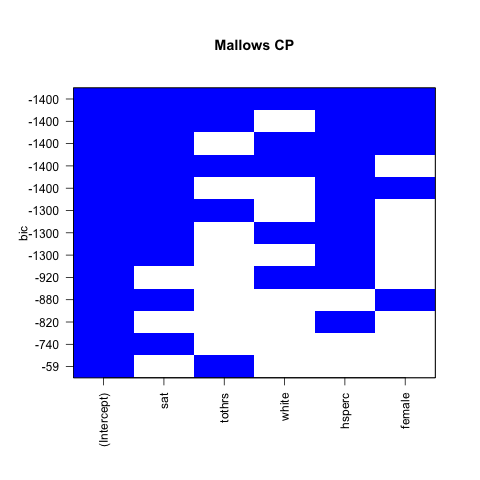

In [44]:
%%R -i gpa2

# Load necessary library
library(leaps)

# Perform exhaustive search for model subsets using regsubsets
gpa2_ss <- regsubsets(colgpa ~ sat + tothrs + white + hsperc + female,
                      method = "exhaustive", nbest = 3, data = gpa2)
plot(gpa2_ss, statistic = "cp", main = "Mallows CP", col = "blue")

# Add a legend to describe variables in the plot
legend(3, 25 ,bty = "y", legend = c('sat=sat', 'tothrs=tothrs',
       'white=white', 'hsperc=hsperc', 'female=female'),
       col = "steelblue4", cex = 1.25)

According to Mallows CP, we concluded that sat and hsperc are the best predictors because they have the lowest bic.

Considering the results of both Boruta and Mallows CP, we select hsperc and sat as the two best predictors for testing simple linear regression models.

## 3. Model Building

### 3a. Model 1: x = hsperc

In [45]:
reg1 = smf.ols('colgpa ~ hsperc', gpa2).fit()
print(reg1.summary())

                            OLS Regression Results                            
Dep. Variable:                 colgpa   R-squared:                       0.184
Model:                            OLS   Adj. R-squared:                  0.183
Method:                 Least Squares   F-statistic:                     930.2
Date:                Fri, 25 Oct 2024   Prob (F-statistic):          1.89e-184
Time:                        13:51:16   Log-Likelihood:                -3722.4
No. Observations:                4137   AIC:                             7449.
Df Residuals:                    4135   BIC:                             7461.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.9804      0.014    210.182      0.0

From the summary of the regression we see that hsperc is negatively correlated with colgpa, with a an estimated coefficient comprised in a 95% confident interval ranging from -0.018 and -0.016. We can interpret this result in the following way: as we take a student one high school percentile below another student (thus we increase hsperc by one unit), we expect the college GPA of the student rank higher to be 0.017 higher (on a 4.0 scale). hsperc alone explains roughly 18% of the variance in colgpa (R-squared=0.184). As expected, the residuals are not normally distributed, with a very large Jarque-Bera statistic.

In [46]:
import statsmodels.stats.api as sms
!pip install simple_colors
from simple_colors import *
# Linearity: Harvey-Collier --> Ho: model is linear
name = ["t-stat", "p-value"]
test = sms.linear_harvey_collier(reg1)
print(blue("Linearity Test Results:",['bold']))
print(list(zip(name, test)))
print("\n")

# Normaility of the Residuals: Jarque-Bera --> Residuals ~ N(0,1)
name = ["Jarque-Bera", "Chi^2 two-tail prob.", "Skew", "Kurtosis"]
test = sms.jarque_bera(reg1.resid)
print(blue("JB Results:",['bold']))
print(list(zip(name, test)))
print("\n")

# Heteroskedasticity: Breush-Pagan --> Ho: var = constant
name = ["Lagrange multiplier statistic", "p-value", "f-value", "f p-value"]
test = sms.het_breuschpagan(reg1.resid, reg1.model.exog)
print(blue("BP Results:",['bold']))
print(list(zip(name, test)))

/opt/anaconda3/lib/python3.12/site-packages/scipy/integrate/_quadpack_py.py:1272: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


Linearity Test Results:
[('t-stat', -7.336869259497689), ('p-value', 2.6181746434761184e-13)]


JB Results:
[('Jarque-Bera', 119.96785222842188), ('Chi^2 two-tail prob.', 8.898399211002158e-27), ('Skew', -0.3715260420380723), ('Kurtosis', 3.3792673681660355)]


BP Results:
[('Lagrange multiplier statistic', 0.3387264905661087), ('p-value', 0.5605652396525527), ('f-value', 0.3385904587981957), ('f p-value', 0.5606756890053517)]


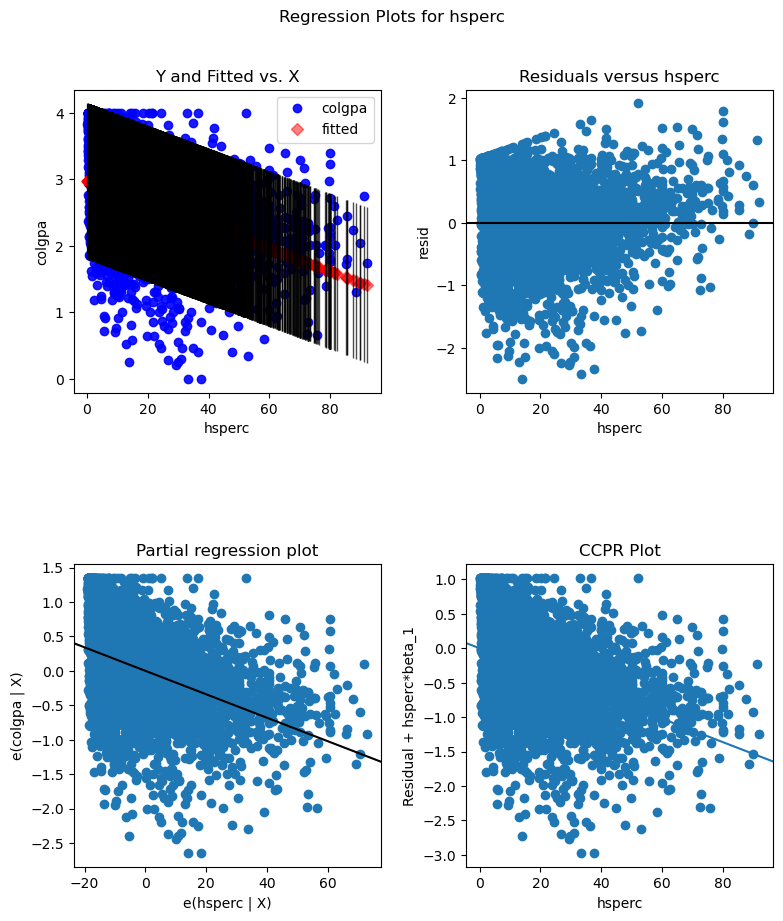

In [47]:
figD = sm.graphics.plot_regress_exog(reg1, "hsperc")
figD.set_figheight(10)
figD.set_figwidth(8)
plt.show()

We notice how many observed values for colgpa fall outside the prediction interval of our regression (top-left graph).
We also notice how residuals present heteroskedasticity, with their variance progressively deminishing as hsperc increases (top-right graph).

[Text(0.5, 0, 'Predicted'), Text(0, 0.5, 'Residuals')]

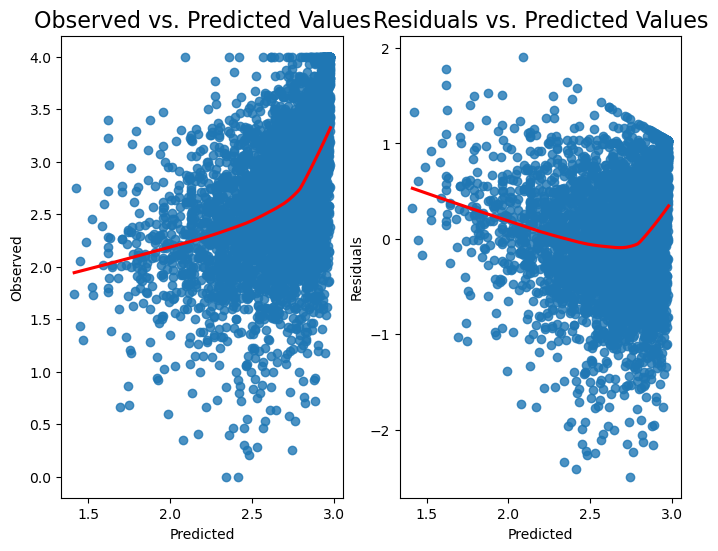

In [48]:
fig, ax = plt.subplots(1,2,figsize=(8, 6))
sns.regplot(x=reg1.fittedvalues, y=gpa2['colgpa'], lowess=True, ax=ax[0], line_kws={'color': 'red'})
ax[0].set_title('Observed vs. Predicted Values', fontsize=16)
ax[0].set(xlabel='Predicted', ylabel='Observed')

sns.regplot(x=reg1.fittedvalues, y=reg1.resid, lowess=True, ax=ax[1], line_kws={'color': 'red'})
ax[1].set_title('Residuals vs. Predicted Values', fontsize=16)
ax[1].set(xlabel='Predicted', ylabel='Residuals')

The relationship between predicted values and observed values is clearly non-linear, denoting clear heteroskedasticity.

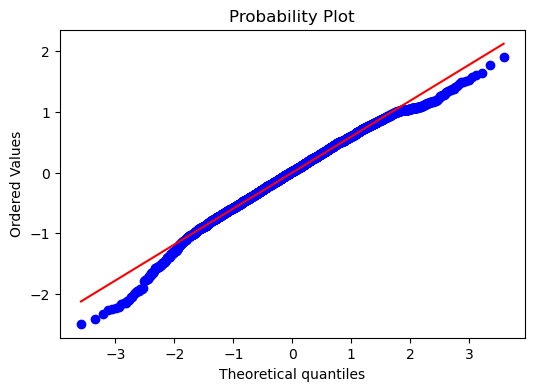

In [49]:
#qq plot of residuals vs normal probability
import scipy as sp
figA, axA = plt.subplots(figsize=(6,4))
_, (__, ___, r) = sp.stats.probplot(reg1.resid, plot = axA, fit=True)

As mentioned earlier, the residuals do not seem to follow a normal distribution. However, from this Q-Q plot, their distribution does not seem to deviate as much as expected.

### Outliers, high leverage, and influential observations

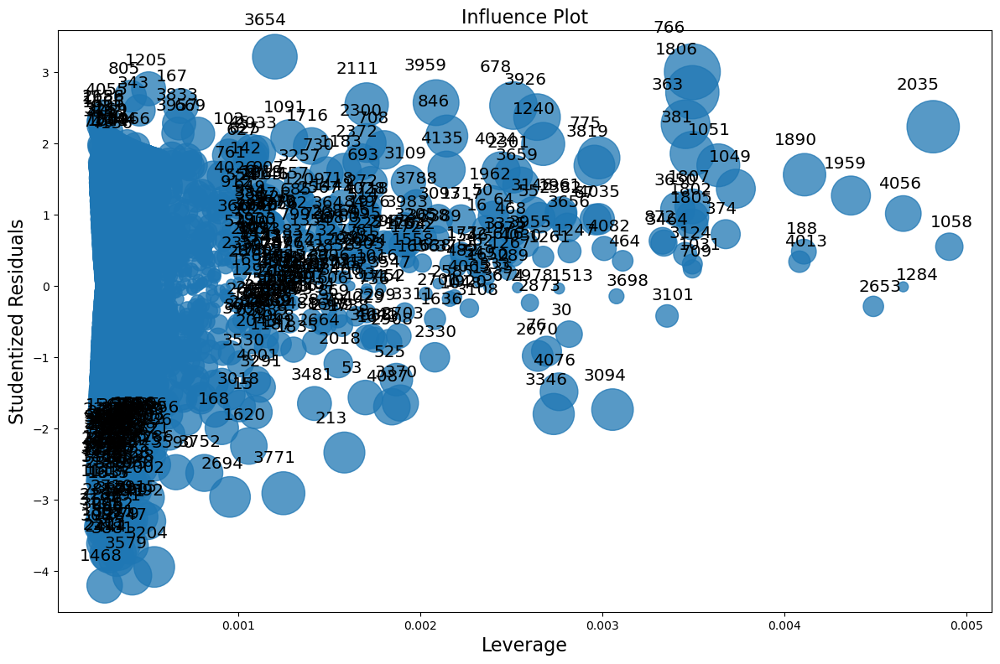

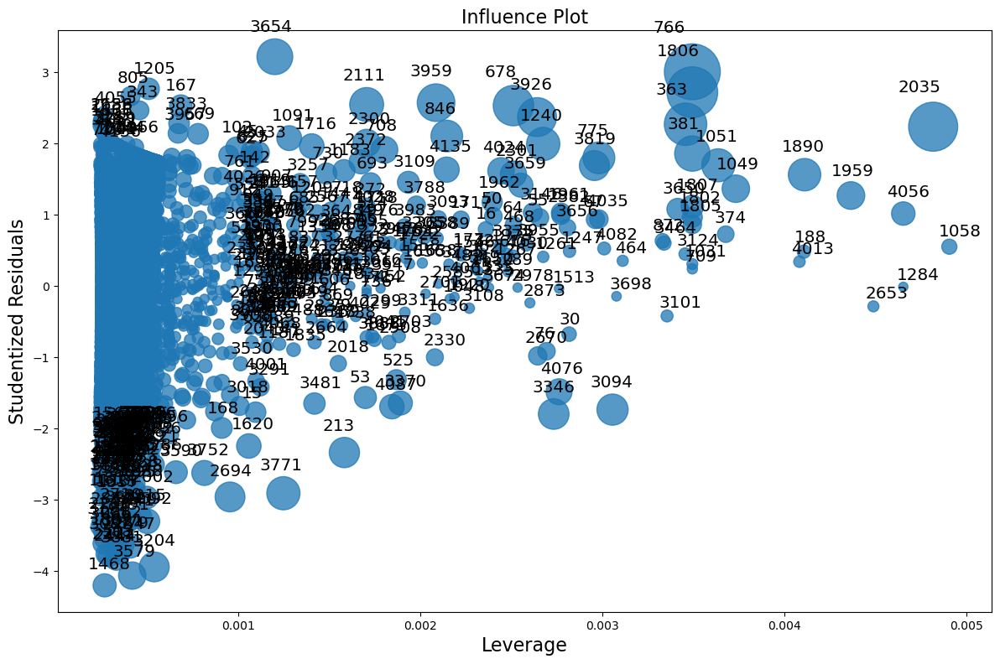

In [50]:
figd, ax = plt.subplots(figsize=(12,8))
figd = sm.graphics.influence_plot(reg1, ax = ax, criterion="DFFITS")
figd.tight_layout(pad=1.0)

fige, ax = plt.subplots(figsize=(12,8))
fige = sm.graphics.influence_plot(reg1, ax = ax, criterion="cooks")
fige.tight_layout(pad=1.0)


次のパッケージを付け加えます: ‘olsrr’

以下のオブジェクトは ‘package:MASS’ からマスクされています:

    cement

以下のオブジェクトは ‘package:datasets’ からマスクされています:

    rivers



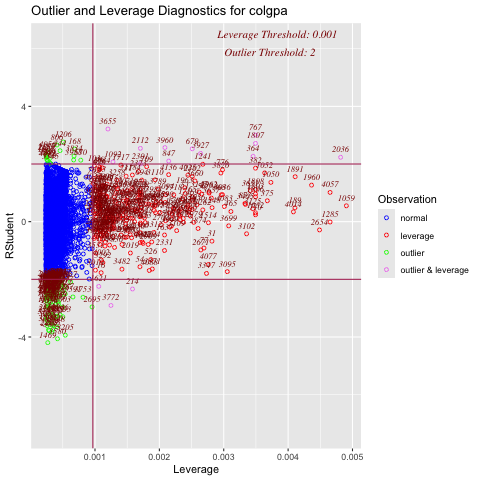

In [51]:
%%R -i gpa2

# Load necessary library for diagnostics
library(olsrr)

# Fit the linear regression model
mreg_mod <- lm(colgpa ~ hsperc, data = gpa2)

# Plot DFBETAS to check for influential data points on each coefficient
ols_plot_resid_lev(mreg_mod)

Our sample clearly contains many observations that can be considered outliers, high-leverage, and influential. However, given the really high number of such observations, we decide not to exclude them from our analysis.

### Bootsrapping

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/3908834336.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  boot_interc.append(results_temp.params[0])
/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/3908834336.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  boot_slopes.append(results_temp.params[1])
/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/3908834336.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a valu

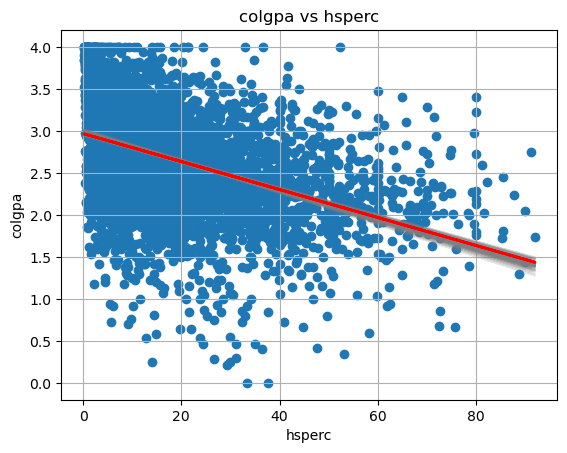

In [52]:
import statsmodels.formula.api as sm

# resample with replacement each row
boot_slopes = []
boot_interc = []
boot_adjR2 = []
n_boots = 100
n_points = gpa2.shape[0]
plt.figure()
for _ in range(n_boots):
 # sample the rows, same size, with replacement
    sample_gpa2 = gpa2.sample(n=n_points, replace=True)
 # fit a linear regression
    ols_model_temp = sm.ols(formula = 'colgpa ~ hsperc', data=sample_gpa2)
    results_temp = ols_model_temp.fit()
 
 # append coefficients
    boot_interc.append(results_temp.params[0])
    boot_slopes.append(results_temp.params[1])
    boot_adjR2.append(results_temp.rsquared_adj)
 
 # plot a greyed out line
    y_pred_temp = ols_model_temp.fit().predict(sample_gpa2['hsperc'])
    plt.plot(sample_gpa2['hsperc'], y_pred_temp, color='grey', alpha=0.2)
# add data points
y_pred = ols_model_temp.fit().predict(gpa2['hsperc'])
plt.scatter(gpa2['hsperc'], gpa2['colgpa'])
plt.plot(gpa2['hsperc'], y_pred, linewidth=2,color = 'red')
plt.grid(True)
plt.xlabel('hsperc')
plt.ylabel('colgpa')
plt.title('colgpa vs hsperc')
plt.show()

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/857300681.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.axvline(reg1.params[1],color='red', linestyle='--')


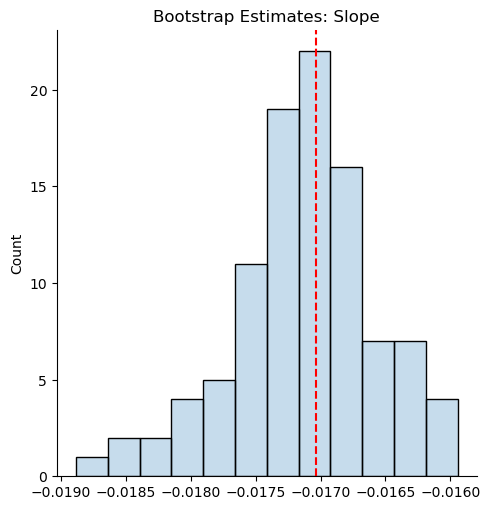

In [53]:
sns.displot(boot_slopes, alpha = 0.25)
plt.axvline(reg1.params[1],color='red', linestyle='--')
plt.title('Bootstrap Estimates: Slope')
plt.show()

# The vertical red line = LS estimate

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/3462887930.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.axvline(reg1.params[0],color='red', linestyle='--')


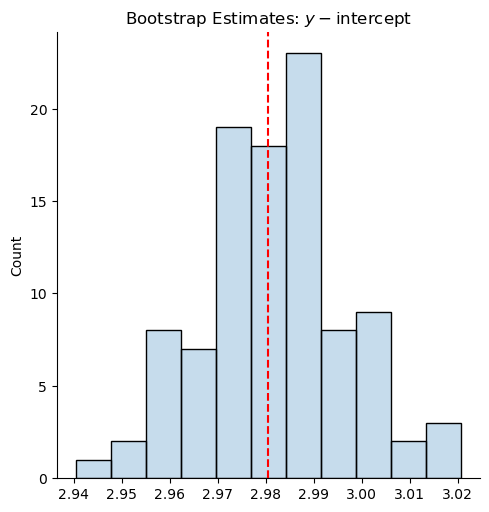

In [54]:
sns.displot(boot_interc, alpha = 0.25)
plt.axvline(reg1.params[0],color='red', linestyle='--')
plt.title('Bootstrap Estimates: $y-$intercept')
plt.show()
# The vertical red line = LS estimate

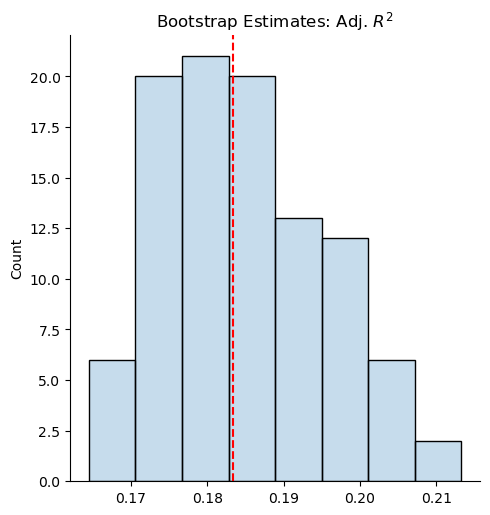

In [55]:
sns.displot(boot_adjR2, alpha = 0.25)
plt.axvline(reg1.rsquared_adj,color='red', linestyle='--')
plt.title('Bootstrap Estimates: Adj. $R^2$')
plt.show()

# The vertical red line = LS estimate

After bootstrapping our model and seeing that our boostrapping estiamte are extremly similar to our LS estimates, we conclude that our estimates are robust - something we expected given the very low p-values on all estimates and the high number of observations in our dataset.

2024-10-25 13:51:37.642 | WARNING  | fitter.fitter:_fit_single_distribution:337 - SKIPPED _fit distribution (taking more than 30 seconds)
2024-10-25 13:51:37.680 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted anglit distribution with error=2.883962)
2024-10-25 13:51:37.726 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted arcsine distribution with error=10.769516)
2024-10-25 13:51:37.743 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted cauchy distribution with error=1.020053)
2024-10-25 13:51:37.773 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted bradford distribution with error=5.841619)
2024-10-25 13:51:37.897 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted alpha distribution with error=0.208209)
2024-10-25 13:51:37.920 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted chi distribution with error=0.159045)
2024-10-25 13:51:37.931 | INFO     | fitter.fitter:_fit_single_distribution:333 - 

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
levy_stable,0.130159,562.478699,587.789604,inf,0.023907,0.017385
exponnorm,0.143802,566.104216,585.087394,inf,0.019162,0.094620
norm,0.143803,564.103779,576.759232,inf,0.019162,0.094622
rice,0.143807,566.146681,585.129860,inf,0.019153,0.094876
foldnorm,0.143883,563.256245,582.239423,inf,0.019191,0.093757


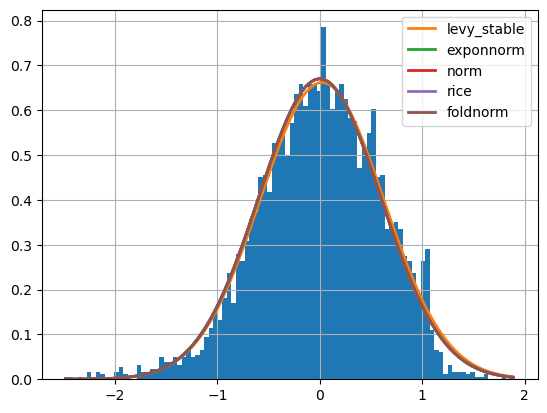

In [56]:
from scipy import stats

# Fit various distributions:
from fitter import Fitter
f = Fitter(reg1.resid)
f.fit()

f.summary()

### 5-Fold Cross Validation

In [57]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

MAE: 0.4628422760674807
MSE: 0.3334183289809869
RMSE: 0.5774238728880084
5-Fold CV RMSE Scores: [-0.57425324 -0.57245095 -0.62376734 -0.61118691 -0.60904863]
5-Fold CV RMSE Scores: [-0.57425324 -0.57245095 -0.62376734 -0.61118691 -0.60904863]


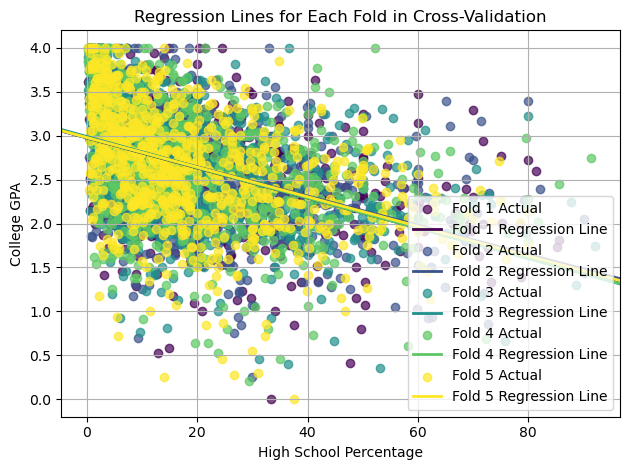

In [58]:
x = gpa[['hsperc']]
y = gpa[['colgpa']]

# OLS fit using all the data
regr = LinearRegression()
model = regr.fit(x, y)
regr.coef_
regr.intercept_

# Split the data into train  (70%)/test(30%) samples:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

# Train the model:
regr = LinearRegression()
regr.fit(x_train, y_train)

# Make predictions based on the test sample
y_pred = regr.predict(x_test)

# Evaluate Performance
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

# Perform a 5-fold CV
# Use MSE as the scoring function (there are other options as shown here:
regr = linear_model.LinearRegression()
scores = cross_val_score(regr, x, y, cv=5, scoring='neg_root_mean_squared_error')
print('5-Fold CV RMSE Scores:', scores)

# Perform a 5-fold CV
# Use MSE as the scoring function (there are other options as shown here:
regr = linear_model.LinearRegression()
scores = cross_val_score(regr, x, y, cv=5, scoring='neg_root_mean_squared_error')
print('5-Fold CV RMSE Scores:', scores)

# Perform a 5-fold CV and store intercepts and coefficients for each fold
kf = KFold(n_splits=5, shuffle=True, random_state=0)
intercept_list = []
coefficient_list = []
fold_c = ['#440154FF', '#3B528BFF', '#21908CFF', '#5DC863FF', '#FDE725FF']

# K-Fold Cross Validation
for fold, (train_index, test_index) in enumerate(kf.split(x)):
    x_train_fold, x_test_fold = x.iloc[train_index], x.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Train the model for this fold
    regr = LinearRegression()
    regr.fit(x_train_fold, y_train_fold)
    
    # Store the coefficients and intercepts
    intercept = regr.intercept_[0]
    coefficient = regr.coef_[0][0]
    intercept_list.append(intercept)
    coefficient_list.append(coefficient)
    
    # Scatter plot for actual values in the test set
    plt.scatter(x_test_fold, y_test_fold, c=fold_c[fold], alpha=0.7, label=f'Fold {fold + 1} Actual')

    # Calculate the predicted values for this fold
    y_pred_fold = regr.predict(x_test_fold)
    
    # Plot the regression line for this fold
    plt.axline(xy1=(0, intercept), slope=coefficient, color=fold_c[fold], 
               label=f'Fold {fold + 1} Regression Line', linewidth=2)

# Customizing the plot
plt.title('Regression Lines for Each Fold in Cross-Validation')
plt.xlabel('High School Percentage')
plt.ylabel('College GPA')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Our model performs really well in a 5-fold cross validation as the regression lines for each fold overlap almost perfectly. This was also expected given the substantial amount of observation in our dataset.

### 3b. Model 2: x = sat

In [59]:
reg2 = smf.ols('colgpa ~ sat', gpa2).fit()
print(reg2.summary())

                            OLS Regression Results                            
Dep. Variable:                 colgpa   R-squared:                       0.167
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     829.3
Date:                Fri, 25 Oct 2024   Prob (F-statistic):          2.32e-166
Time:                        13:52:48   Log-Likelihood:                -3764.0
No. Observations:                4137   AIC:                             7532.
Df Residuals:                    4135   BIC:                             7545.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.6631      0.070      9.510      0.0

From the summary of the regression we see that sat is positively correlated with colgpa, with a statistically significant estimated coefficient of 0.0019 and extremely tight 95% confident interval. We can interpret this result in the following way: as a student scores one point higher on his SAT, we expect their college GPA to be 0.0019 higher (on a 4.0 scale). sat alone explains roughly 16.7% of the variance in colgpa (R-squared=0.167). As expected, the resiuals are not normally distributed, with a very large Jarque-Bera statistic.

In [60]:
import statsmodels.stats.api as sms
!pip install simple_colors
from simple_colors import *
# Linearity: Harvey-Collier --> Ho: model is linear
name = ["t-stat", "p-value"]
test = sms.linear_harvey_collier(reg2)
print(blue("Linearity Test Results:",['bold']))
print(list(zip(name, test)))
print("\n")

# Normaility of the Residuals: Jarque-Bera --> Residuals ~ N(0,1)
name = ["Jarque-Bera", "Chi^2 two-tail prob.", "Skew", "Kurtosis"]
test = sms.jarque_bera(reg2.resid)
print(blue("JB Results:",['bold']))
print(list(zip(name, test)))
print("\n")

# Heteroskedasticity: Breush-Pagan --> Ho: var = constant
name = ["Lagrange multiplier statistic", "p-value", "f-value", "f p-value"]
test = sms.het_breuschpagan(reg2.resid, reg2.model.exog)
print(blue("BP Results:",['bold']))
print(list(zip(name, test)))

Linearity Test Results:
[('t-stat', -2.657668945507009), ('p-value', 0.007898599460659203)]


JB Results:
[('Jarque-Bera', 151.698639089161), ('Chi^2 two-tail prob.', 1.1456687460803912e-33), ('Skew', -0.4133974058198463), ('Kurtosis', 3.443238601025867)]


BP Results:
[('Lagrange multiplier statistic', 2.678037525742766), ('p-value', 0.10174103800241215), ('f-value', 2.678476729547814), ('f p-value', 0.10178907842793135)]


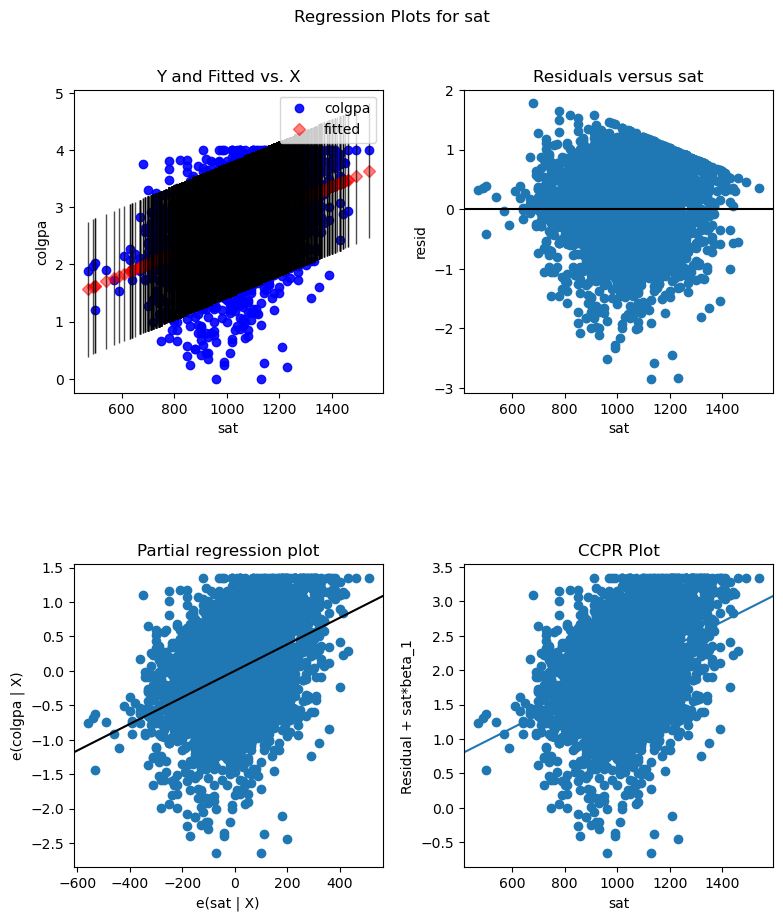

In [66]:
import statsmodels.api as sm

figD = sm.graphics.plot_regress_exog(reg2, "sat")
figD.set_figheight(10)
figD.set_figwidth(8)
plt.show()

We notice how many observed values for colgpa fall outside the prediction interval of our regression (top-left graph).
We also notice how residuals present heteroskedasticity, with their variance initially increasing and then decreasing as hsperc increases (top-right graph).

[Text(0.5, 0, 'Predicted'), Text(0, 0.5, 'Residuals')]

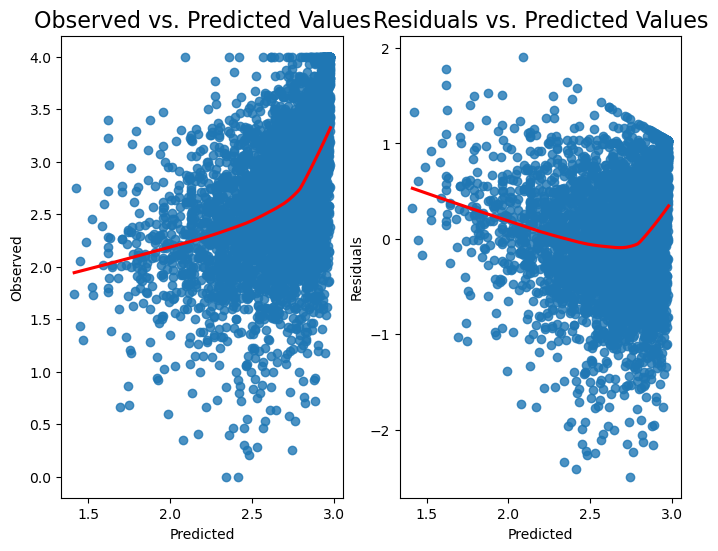

In [67]:
fig, ax = plt.subplots(1,2,figsize=(8, 6))
sns.regplot(x=reg1.fittedvalues, y=gpa2['colgpa'], lowess=True, ax=ax[0], line_kws={'color': 'red'})
ax[0].set_title('Observed vs. Predicted Values', fontsize=16)
ax[0].set(xlabel='Predicted', ylabel='Observed')

sns.regplot(x=reg1.fittedvalues, y=reg1.resid, lowess=True, ax=ax[1], line_kws={'color': 'red'})
ax[1].set_title('Residuals vs. Predicted Values', fontsize=16)
ax[1].set(xlabel='Predicted', ylabel='Residuals')

The relationship between predicted values and observed values is clearly non-linear, denoting clear heteroskedasticity.
The graph for the residuals look particularly similar to the one we saw in Model 1.

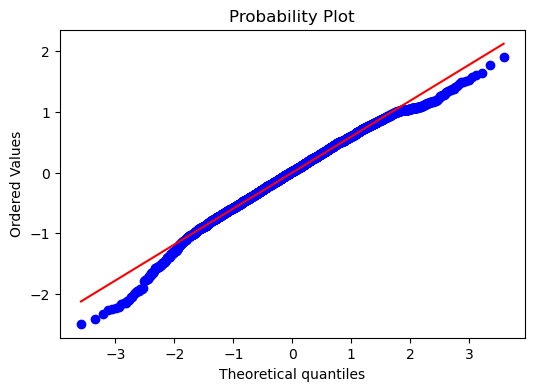

In [68]:
#qq plot of residuals vs normal probability
import scipy as sp
figA, axA = plt.subplots(figsize=(6,4))
_, (__, ___, r) = sp.stats.probplot(reg1.resid, plot = axA, fit=True)

As mentioned earlier, the residuals do not seem to follow a normal distribution, in a much similar way to what we saw in Model 1. However, from this Q-Q plot, their distribution does not seem to deviate as much as expected.

### Outliers, high leverage, and influential observations

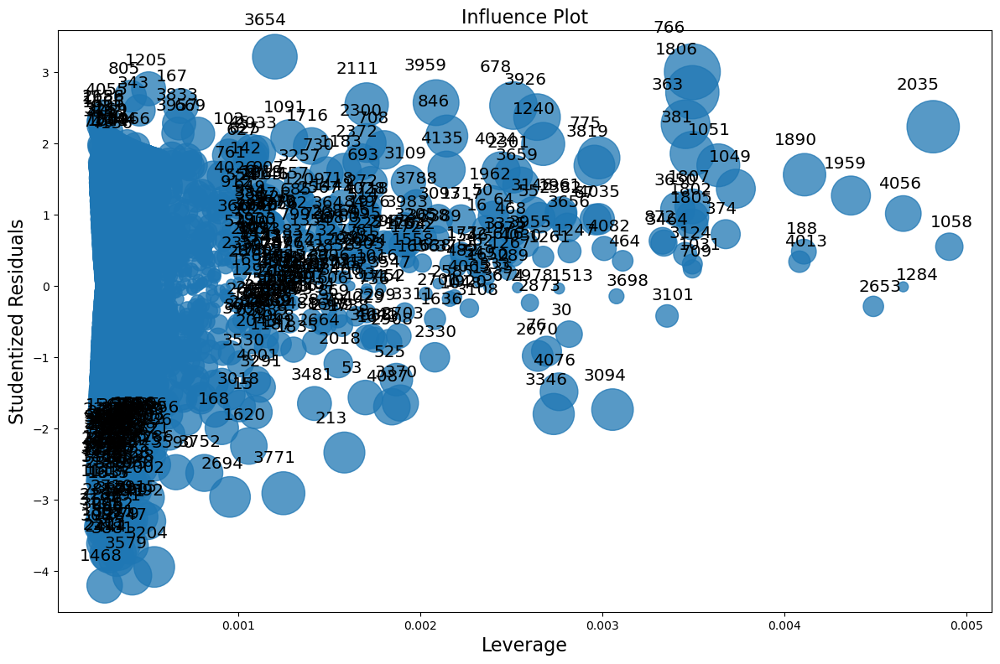

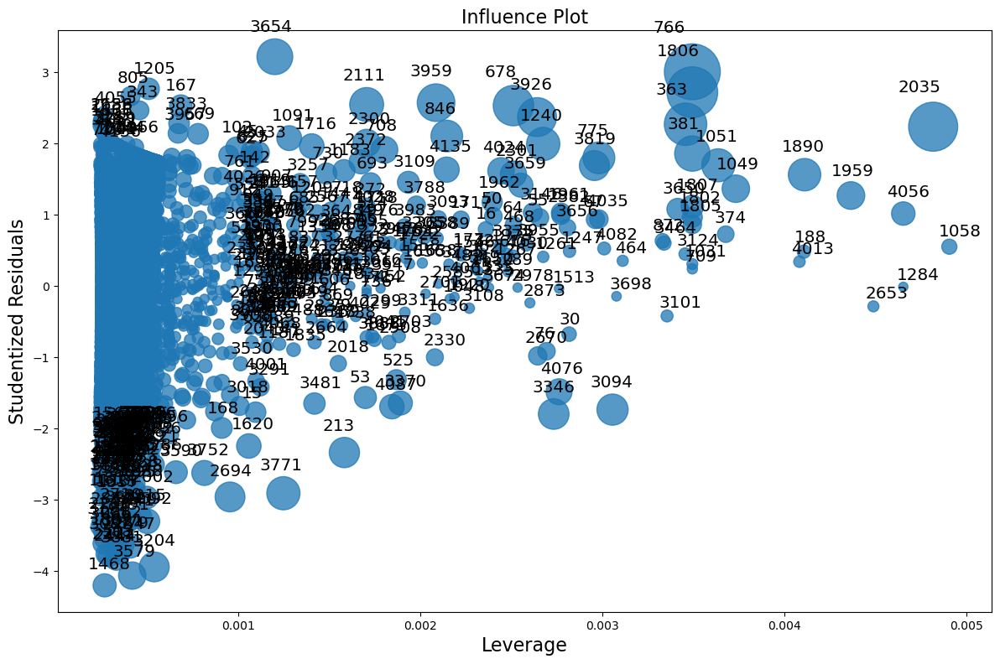

In [69]:
figd, ax = plt.subplots(figsize=(12,8))
figd = sm.graphics.influence_plot(reg1, ax = ax, criterion="DFFITS")
figd.tight_layout(pad=1.0)

fige, ax = plt.subplots(figsize=(12,8))
fige = sm.graphics.influence_plot(reg1, ax = ax, criterion="cooks")
fige.tight_layout(pad=1.0)

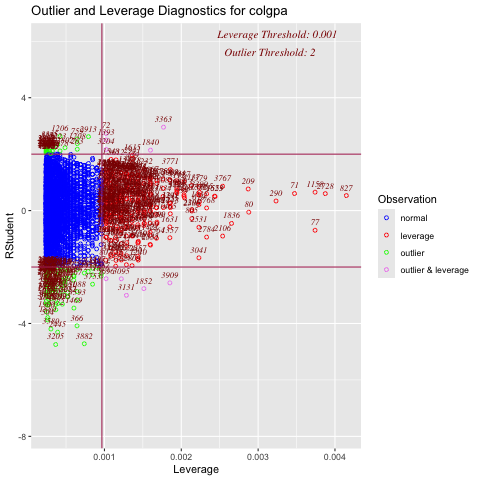

In [70]:
%%R -i gpa2

# Load necessary library for diagnostics
library(olsrr)

# Fit the linear regression model
mreg_mod <- lm(colgpa ~ sat, data = gpa2)

# Plot DFBETAS to check for influential data points on each coefficient
ols_plot_resid_lev(mreg_mod)

Our sample clearly contains many observations that can be considered outliers, high-leverage, and influential. However, as previously stated, given the really high number of such observations, we decide not to exclude them from our analysis.


### Bootsrapping

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/3874111753.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  boot_interc.append(results_temp.params[0])
/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/3874111753.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  boot_slopes.append(results_temp.params[1])
/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/3874111753.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a valu

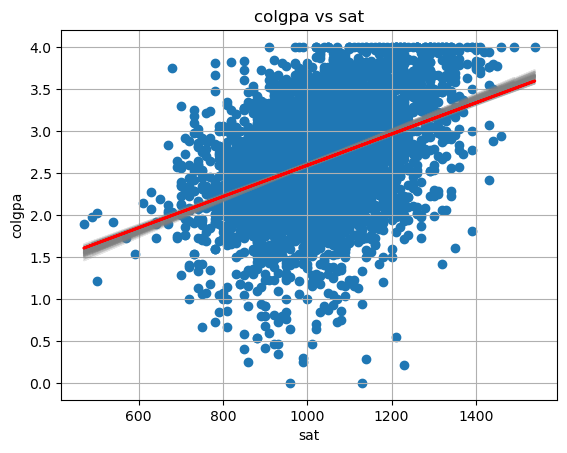

In [75]:
# resample with replacement each row
boot_slopes = []
boot_interc = []
boot_adjR2 = []
n_boots = 100
n_points = gpa2.shape[0]
plt.figure()
for _ in range(n_boots):
 # sample the rows, same size, with replacement
    sample_gpa2 = gpa2.sample(n=n_points, replace=True)
 # fit a linear regression
    ols_model_temp = smf.ols(formula = 'colgpa ~ sat', data=sample_gpa2)
    results_temp = ols_model_temp.fit()
 
 # append coefficients
    boot_interc.append(results_temp.params[0])
    boot_slopes.append(results_temp.params[1])
    boot_adjR2.append(results_temp.rsquared_adj)
 
 # plot a greyed out line
    y_pred_temp = ols_model_temp.fit().predict(sample_gpa2['sat'])
    plt.plot(sample_gpa2['sat'], y_pred_temp, color='grey', alpha=0.2)
# add data points
y_pred = ols_model_temp.fit().predict(gpa2['sat'])
plt.scatter(gpa2['sat'], gpa2['colgpa'])
plt.plot(gpa2['sat'], y_pred, linewidth=2,color = 'red')
plt.grid(True)
plt.xlabel('sat')
plt.ylabel('colgpa')
plt.title('colgpa vs sat')
plt.show()

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/3686662146.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.axvline(reg2.params[1],color='red', linestyle='--')


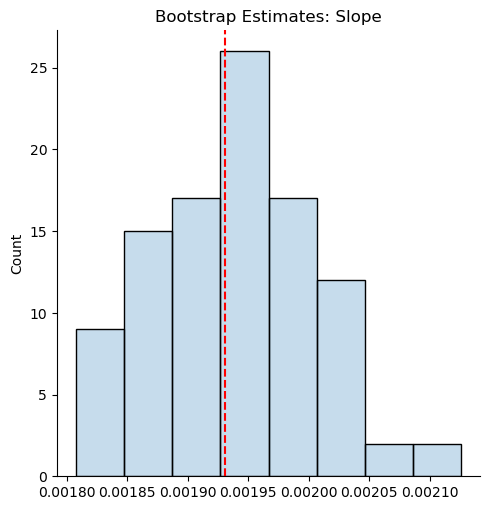

In [76]:
sns.displot(boot_slopes, alpha = 0.25)
plt.axvline(reg2.params[1],color='red', linestyle='--')
plt.title('Bootstrap Estimates: Slope')
plt.show()

# The vertical red line = LS estimate

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/4168001697.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.axvline(reg2.params[0],color='red', linestyle='--')


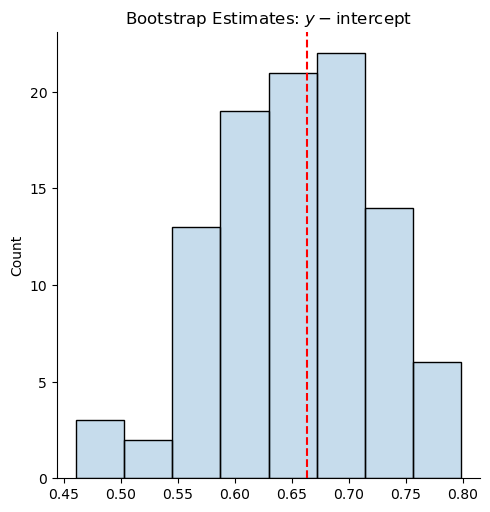

In [77]:
sns.displot(boot_interc, alpha = 0.25)
plt.axvline(reg2.params[0],color='red', linestyle='--')
plt.title('Bootstrap Estimates: $y-$intercept')
plt.show()
# The vertical red line = LS estimate

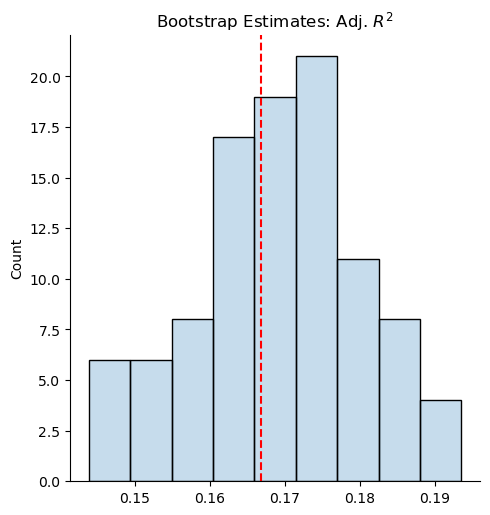

In [78]:
sns.displot(boot_adjR2, alpha = 0.25)
plt.axvline(reg2.rsquared_adj,color='red', linestyle='--')
plt.title('Bootstrap Estimates: Adj. $R^2$')
plt.show()

# The vertical red line = LS estimate

After bootstrapping our model and seeing that our bootstrapping estiamte are extremely similar to our LS estimates, we conclude that our estiamtes are robust - something we expected given the very low p-values on all estimates and the high number of observations in our dataset.

2024-10-25 13:56:48.115 | WARNING  | fitter.fitter:_fit_single_distribution:337 - SKIPPED _fit distribution (taking more than 30 seconds)
2024-10-25 13:56:48.149 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted anglit distribution with error=3.411354)
2024-10-25 13:56:48.276 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted bradford distribution with error=5.691401)
2024-10-25 13:56:48.492 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted argus distribution with error=3.018682)
2024-10-25 13:56:48.561 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted cauchy distribution with error=1.005942)
2024-10-25 13:56:48.618 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted alpha distribution with error=0.229079)
2024-10-25 13:56:48.685 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted beta distribution with error=0.109115)
2024-10-25 13:56:48.864 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fi

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
pearson3,0.091713,588.400136,607.383314,inf,0.013663,0.418934
johnsonsb,0.092641,589.617177,614.928082,inf,0.014000,0.388499
genhyperbolic,0.092892,591.513821,623.152451,inf,0.014262,0.365864
johnsonsu,0.095043,583.287007,608.597911,inf,0.014663,0.332823
norminvgauss,0.095083,583.475395,608.786300,inf,0.014401,0.354113


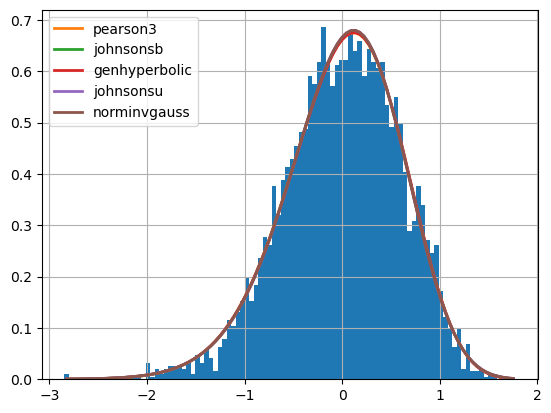

/opt/anaconda3/lib/python3.12/site-packages/scipy/integrate/_quadpack_py.py:1272: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


In [79]:
#Fit various distributon
f = Fitter(reg2.resid)
f.fit()

f.summary()

### 5-Fold Cross Validation

MAE: 0.4708950023211622
MSE: 0.3404698540824385
RMSE: 0.5834979469393518
5-Fold CV RMSE Scores: [-0.56495247 -0.58658182 -0.61271611 -0.62034055 -0.62167929]
5-Fold CV RMSE Scores: [-0.56495247 -0.58658182 -0.61271611 -0.62034055 -0.62167929]


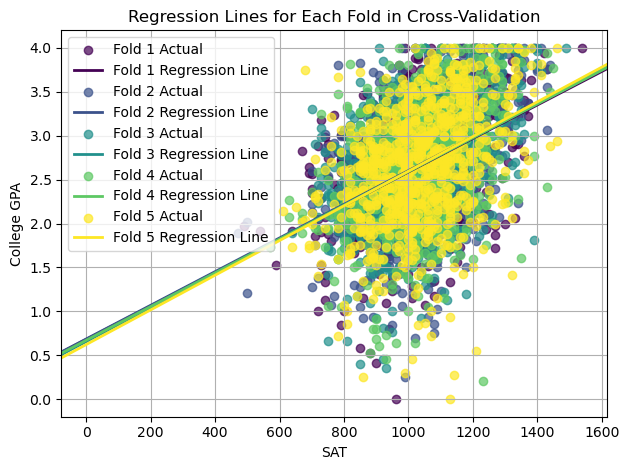

In [80]:
x = gpa[['sat']]
y = gpa[['colgpa']]

# OLS fit using all the data
regr = LinearRegression()
model = regr.fit(x, y)
regr.coef_
regr.intercept_

# Split the data into train  (70%)/test(30%) samples:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

# Train the model:
regr = LinearRegression()
regr.fit(x_train, y_train)

# Make predictions based on the test sample
y_pred = regr.predict(x_test)

# Evaluate Performance
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

# Perform a 5-fold CV
# Use MSE as the scoring function (there are other options as shown here:
regr = linear_model.LinearRegression()
scores = cross_val_score(regr, x, y, cv=5, scoring='neg_root_mean_squared_error')
print('5-Fold CV RMSE Scores:', scores)

# Perform a 5-fold CV
# Use MSE as the scoring function (there are other options as shown here:
regr = linear_model.LinearRegression()
scores = cross_val_score(regr, x, y, cv=5, scoring='neg_root_mean_squared_error')
print('5-Fold CV RMSE Scores:', scores)

# Perform a 5-fold CV and store intercepts and coefficients for each fold
kf = KFold(n_splits=5, shuffle=True, random_state=0)
intercept_list = []
coefficient_list = []
fold_c = ['#440154FF', '#3B528BFF', '#21908CFF', '#5DC863FF', '#FDE725FF']

# K-Fold Cross Validation
for fold, (train_index, test_index) in enumerate(kf.split(x)):
    x_train_fold, x_test_fold = x.iloc[train_index], x.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Train the model for this fold
    regr = LinearRegression()
    regr.fit(x_train_fold, y_train_fold)
    
    # Store the coefficients and intercepts
    intercept = regr.intercept_[0]
    coefficient = regr.coef_[0][0]
    intercept_list.append(intercept)
    coefficient_list.append(coefficient)
    
    # Scatter plot for actual values in the test set
    plt.scatter(x_test_fold, y_test_fold, c=fold_c[fold], alpha=0.7, label=f'Fold {fold + 1} Actual')

    # Calculate the predicted values for this fold
    y_pred_fold = regr.predict(x_test_fold)
    
    # Plot the regression line for this fold
    plt.axline(xy1=(0, intercept), slope=coefficient, color=fold_c[fold], 
               label=f'Fold {fold + 1} Regression Line', linewidth=2)

# Customizing the plot
plt.title('Regression Lines for Each Fold in Cross-Validation')
plt.xlabel('SAT')
plt.ylabel('College GPA')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Our model performs really well in a 5-fold cross validation as the regression lines for each fold overlap almost perfectly. This was also expected given the substantial amount of observation in our dataset.

### 3.c Model 3: x = hsperc_sqrt

We now test a model using the square root of hsperc (a very close and more interpretable approximation of the box-cox transformation for lambda=0.5. This is based on an approxiamtion to 0.5 of our Box-cox test's result of 0.3).

In [81]:
reg3 = smf.ols('colgpa ~ hsperc_sqrt', gpa2).fit()
print(reg3.summary())

                            OLS Regression Results                            
Dep. Variable:                 colgpa   R-squared:                       0.226
Model:                            OLS   Adj. R-squared:                  0.226
Method:                 Least Squares   F-statistic:                     1210.
Date:                Fri, 25 Oct 2024   Prob (F-statistic):          1.01e-232
Time:                        13:57:56   Log-Likelihood:                -3611.3
No. Observations:                4137   AIC:                             7227.
Df Residuals:                    4135   BIC:                             7239.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       3.3222      0.021    156.308      

From the summary of the regression we see that the square root of hsperc is negatively correlated with colgpa, with an estimated coefficient comprised in a 95% confident interval ranging from -0.0178 and -0.0159, which is extremely similar to the one we had for the coefficient on the untransformed version of this variable. The interpretation of the coefficient remains the same, except for the fact that now it denotes the predicted change in colgpa for a one unit change in the square root of high school percentile. However, a notable difference with the model using the untransformed version of hsperc is that this model explains roughly 23% of the variance in colgpa (R-squared=0.226), a slighlty better result than the untransformed version of the model. Finally, the residuals are not normally distributed, with a Jarque-Bera statistic very similar to the one we saw for the untransformed model.

In [82]:
import statsmodels.stats.api as sms
!pip install simple_colors
from simple_colors import *
# Linearity: Harvey-Collier --> Ho: model is linear
name = ["t-stat", "p-value"]
test = sms.linear_harvey_collier(reg3)
print(blue("Linearity Test Results:",['bold']))
print(list(zip(name, test)))
print("\n")

# Normaility of the Residuals: Jarque-Bera --> Residuals ~ N(0,1)
name = ["Jarque-Bera", "Chi^2 two-tail prob.", "Skew", "Kurtosis"]
test = sms.jarque_bera(reg3.resid)
print(blue("JB Results:",['bold']))
print(list(zip(name, test)))
print("\n")

# Heteroskedasticity: Breush-Pagan --> Ho: var = constant
name = ["Lagrange multiplier statistic", "p-value", "f-value", "f p-value"]
test = sms.het_breuschpagan(reg3.resid, reg3.model.exog)
print(blue("BP Results:",['bold']))
print(list(zip(name, test)))

Linearity Test Results:
[('t-stat', -8.112358856912547), ('p-value', 6.484502031705276e-16)]


JB Results:
[('Jarque-Bera', 158.68236836135287), ('Chi^2 two-tail prob.', 3.487879903490263e-35), ('Skew', -0.41623054165310036), ('Kurtosis', 3.477046547383818)]


BP Results:
[('Lagrange multiplier statistic', 0.014755148251697991), ('p-value', 0.9033181644643169), ('f-value', 0.014748067592427846), ('f p-value', 0.9033471519596293)]


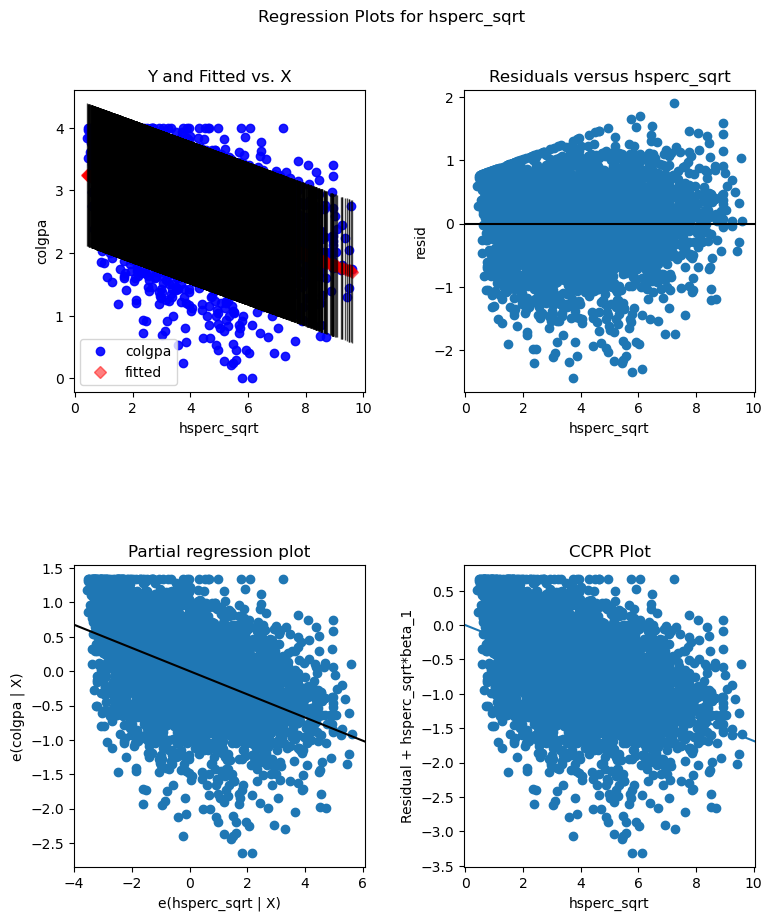

In [83]:
figD = sm.graphics.plot_regress_exog(reg3, "hsperc_sqrt")
figD.set_figheight(10)
figD.set_figwidth(8)
plt.show()

We notice how many observed values for colgpa fall outside the prediction interval of our regression (top-left graph).
We also notice how residuals still present heteroskedasticity, but to a lesser extent than our two previous models (top-right graph).

[Text(0.5, 0, 'Predicted'), Text(0, 0.5, 'Residuals')]

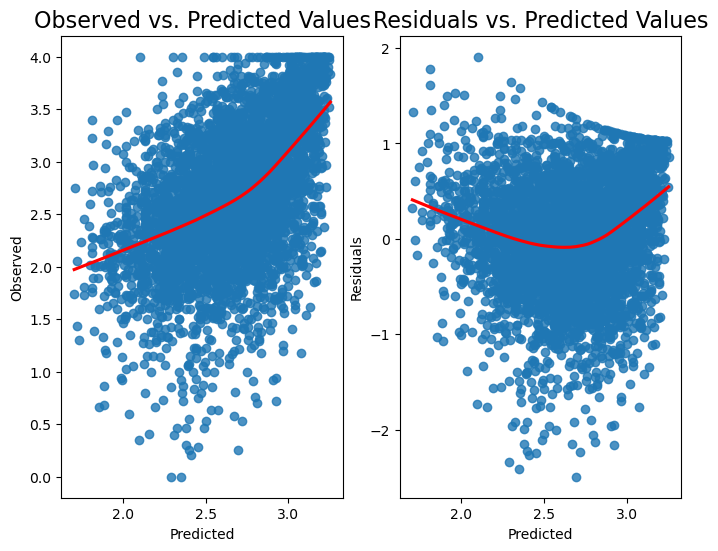

In [84]:
fig, ax = plt.subplots(1,2,figsize=(8, 6))
sns.regplot(x=reg3.fittedvalues, y=gpa2['colgpa'], lowess=True, ax=ax[0], line_kws={'color': 'red'})
ax[0].set_title('Observed vs. Predicted Values', fontsize=16)
ax[0].set(xlabel='Predicted', ylabel='Observed')

sns.regplot(x=reg3.fittedvalues, y=reg1.resid, lowess=True, ax=ax[1], line_kws={'color': 'red'})
ax[1].set_title('Residuals vs. Predicted Values', fontsize=16)
ax[1].set(xlabel='Predicted', ylabel='Residuals')

The relationship between predicted values and observed values appears to be closer to linear than in our two previous models.

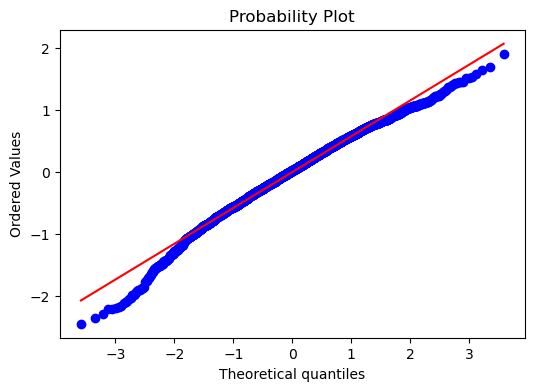

In [85]:
#qq plot of residuals vs normal probability
import scipy as sp
figA, axA = plt.subplots(figsize=(6,4))
_, (__, ___, r) = sp.stats.probplot(reg3.resid, plot = axA, fit=True)

As mentioned earlier, the residuals do not seem to follow a normal distribution. However, from this Q-Q plot, their distribution seems to deviate less from a normal one than in our previous models.

### Outliers, high leverage, and influential observations

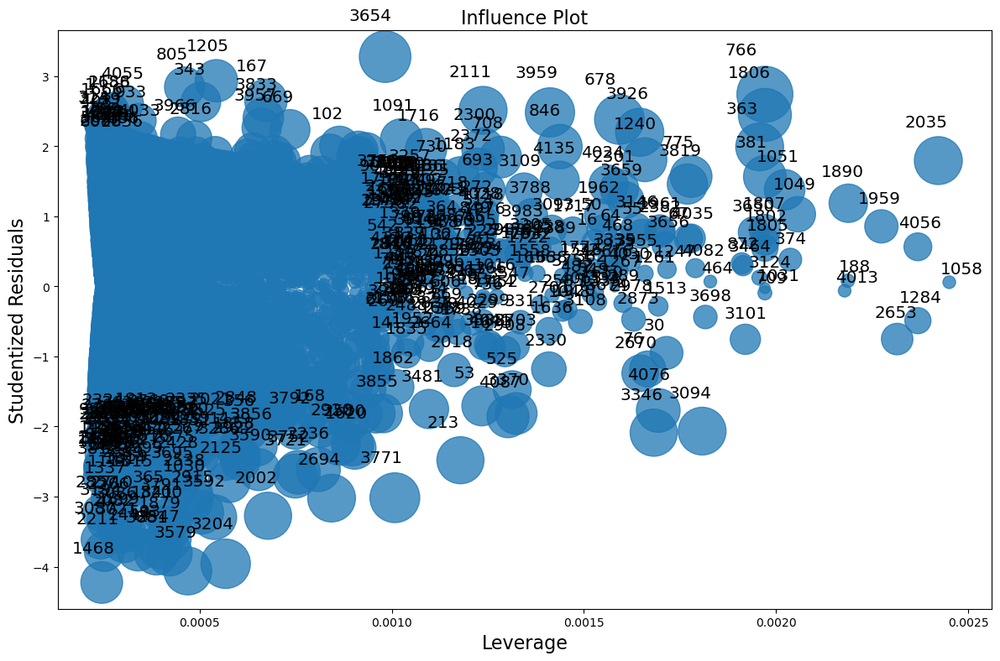

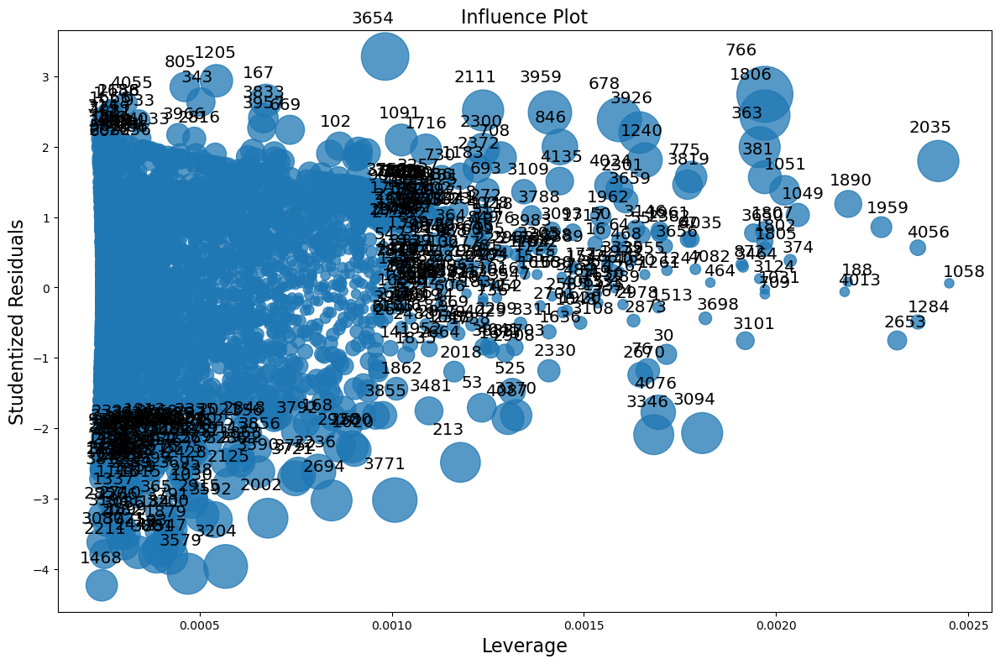

In [86]:
figd, ax = plt.subplots(figsize=(12,8))
figd = sm.graphics.influence_plot(reg3, ax = ax, criterion="DFFITS")
figd.tight_layout(pad=1.0)

fige, ax = plt.subplots(figsize=(12,8))
fige = sm.graphics.influence_plot(reg3, ax = ax, criterion="cooks")
fige.tight_layout(pad=1.0)

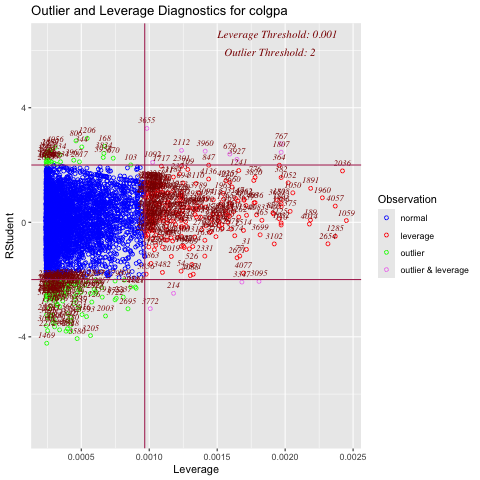

In [87]:
%%R -i gpa2

# Load necessary library for diagnostics
library(olsrr)

# Fit the linear regression model
mreg_mod <- lm(colgpa ~ hsperc_sqrt, data = gpa2)

# Plot DFBETAS to check for influential data points on each coefficient
ols_plot_resid_lev(mreg_mod)

Once more, our sample clearly contains many observations that can be considered outliers, high-leverage, and influential. However, given the really high number of such observations, we decide not to exclude them from our analysis.

### Bootsrapping

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/2218658346.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  boot_interc.append(results_temp.params[0])
/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/2218658346.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  boot_slopes.append(results_temp.params[1])
/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/2218658346.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a valu

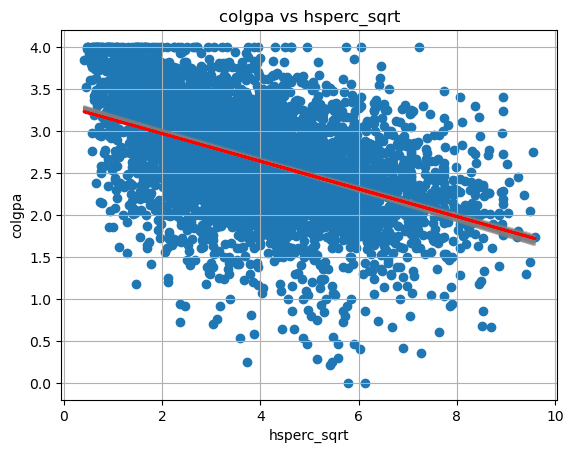

In [88]:
import statsmodels.formula.api as sm

# resample with replacement each row
boot_slopes = []
boot_interc = []
boot_adjR2 = []
n_boots = 100
n_points = gpa2.shape[0]
plt.figure()
for _ in range(n_boots):
 # sample the rows, same size, with replacement
    sample_gpa2 = gpa2.sample(n=n_points, replace=True)
 # fit a linear regression
    ols_model_temp = sm.ols(formula = 'colgpa ~ hsperc_sqrt', data=sample_gpa2)
    results_temp = ols_model_temp.fit()
 
 # append coefficients
    boot_interc.append(results_temp.params[0])
    boot_slopes.append(results_temp.params[1])
    boot_adjR2.append(results_temp.rsquared_adj)
 
 # plot a greyed out line
    y_pred_temp = ols_model_temp.fit().predict(sample_gpa2['hsperc_sqrt'])
    plt.plot(sample_gpa2['hsperc_sqrt'], y_pred_temp, color='grey', alpha=0.2)
# add data points
y_pred = ols_model_temp.fit().predict(gpa2['hsperc_sqrt'])
plt.scatter(gpa2['hsperc_sqrt'], gpa2['colgpa'])
plt.plot(gpa2['hsperc_sqrt'], y_pred, linewidth=2,color = 'red')
plt.grid(True)
plt.xlabel('hsperc_sqrt')
plt.ylabel('colgpa')
plt.title('colgpa vs hsperc_sqrt')
plt.show()

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/3684453604.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.axvline(reg3.params[1],color='red', linestyle='--')


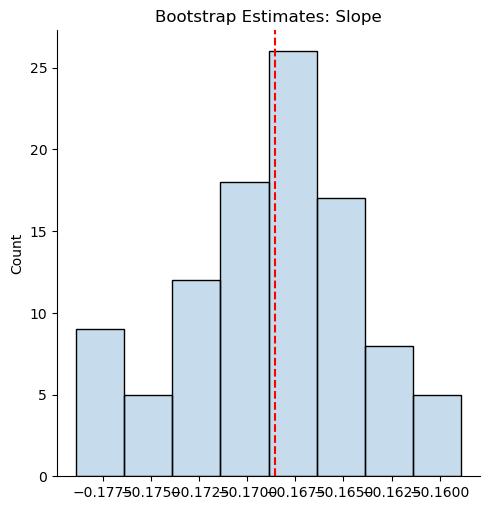

In [89]:
sns.displot(boot_slopes, alpha = 0.25)
plt.axvline(reg3.params[1],color='red', linestyle='--')
plt.title('Bootstrap Estimates: Slope')
plt.show()

# The vertical red line = LS estimate

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/719220575.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.axvline(reg3.params[0],color='red', linestyle='--')


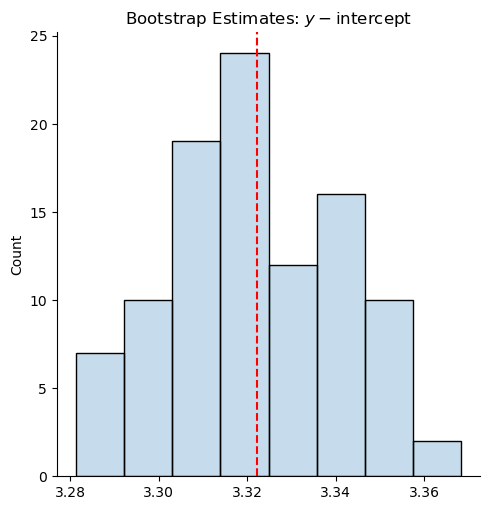

In [90]:
sns.displot(boot_interc, alpha = 0.25)
plt.axvline(reg3.params[0],color='red', linestyle='--')
plt.title('Bootstrap Estimates: $y-$intercept')
plt.show()
# The vertical red line = LS estimate

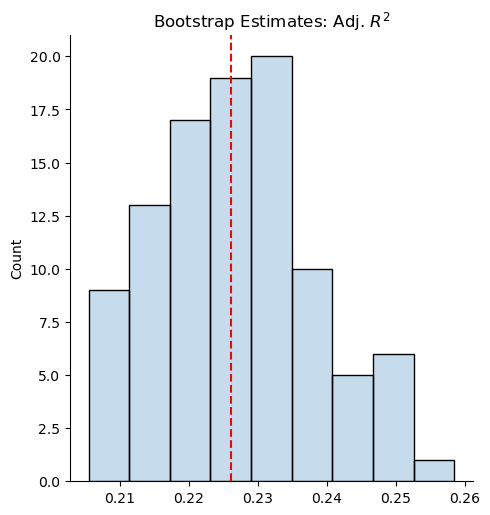

In [91]:
sns.displot(boot_adjR2, alpha = 0.25)
plt.axvline(reg3.rsquared_adj,color='red', linestyle='--')
plt.title('Bootstrap Estimates: Adj. $R^2$')
plt.show()

# The vertical red line = LS estimate

After bootstrapping our model and seeing that our boostrapping estiamte are extremly similar to our LS estimates, we conclude that our estimates are robust - something we expected given the very low p-values on all estimates and the high number of observations in our dataset.

2024-10-25 13:58:51.582 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted anglit distribution with error=3.196833)
2024-10-25 13:58:51.667 | WARNING  | fitter.fitter:_fit_single_distribution:337 - SKIPPED _fit distribution (taking more than 30 seconds)
2024-10-25 13:58:51.694 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted alpha distribution with error=0.320934)
2024-10-25 13:58:51.710 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted cauchy distribution with error=1.102893)
2024-10-25 13:58:51.732 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted arcsine distribution with error=11.488372)
2024-10-25 13:58:51.746 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted bradford distribution with error=7.369329)
2024-10-25 13:58:51.805 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted cosine distribution with error=1.974114)
2024-10-25 13:58:51.808 | INFO     | fitter.fitter:_fit_single_distribution:333

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
beta,0.178888,561.776953,587.087858,inf,0.010738,0.722417
pearson3,0.178895,559.777985,578.761163,inf,0.010747,0.721512
johnsonsb,0.180183,559.609842,584.920747,inf,0.011751,0.613015
loggamma,0.182583,551.394404,570.377583,inf,0.011810,0.606641
gengamma,0.183472,554.749794,580.060698,inf,0.012784,0.504314


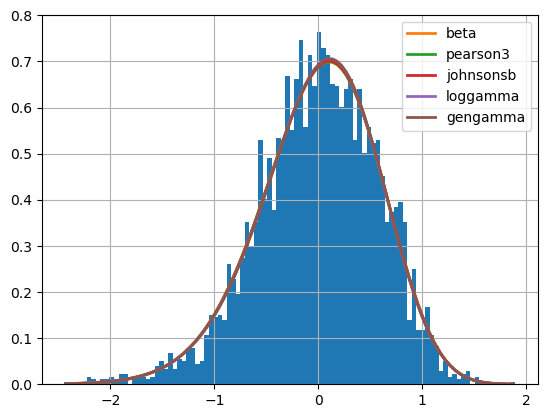

/opt/anaconda3/lib/python3.12/site-packages/scipy/integrate/_quadpack_py.py:1272: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


In [92]:
#Fit various distributon
f = Fitter(reg3.resid)
f.fit()

f.summary()

### 5-Fold Cross Validation

MAE: 0.44869937145030026
MSE: 0.31442035133158136
RMSE: 0.5607319781603163
5-Fold CV RMSE Scores: [-0.56355407 -0.55452992 -0.60644404 -0.59552365 -0.59410643]


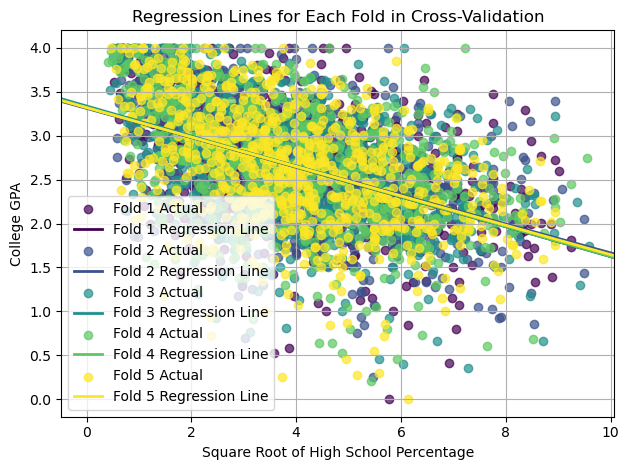

In [93]:
x = gpa2[['hsperc_sqrt']]
y = gpa2[['colgpa']]

# OLS fit using all the data
regr = LinearRegression()
model = regr.fit(x, y)
regr.coef_
regr.intercept_

# Split the data into train  (70%)/test(30%) samples:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

# Train the model:
regr = LinearRegression()
regr.fit(x_train, y_train)

# Make predictions based on the test sample
y_pred = regr.predict(x_test)

# Evaluate Performance
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

# Perform a 5-fold CV
# Use MSE as the scoring function (there are other options as shown here:
regr = linear_model.LinearRegression()
scores = cross_val_score(regr, x, y, cv=5, scoring='neg_root_mean_squared_error')
print('5-Fold CV RMSE Scores:', scores)

# Perform a 5-fold CV and store intercepts and coefficients for each fold
kf = KFold(n_splits=5, shuffle=True, random_state=0)
intercept_list = []
coefficient_list = []
fold_c = ['#440154FF', '#3B528BFF', '#21908CFF', '#5DC863FF', '#FDE725FF']

# K-Fold Cross Validation
for fold, (train_index, test_index) in enumerate(kf.split(x)):
    x_train_fold, x_test_fold = x.iloc[train_index], x.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Train the model for this fold
    regr = LinearRegression()
    regr.fit(x_train_fold, y_train_fold)
    
    # Store the coefficients and intercepts
    intercept = regr.intercept_[0]
    coefficient = regr.coef_[0][0]
    intercept_list.append(intercept)
    coefficient_list.append(coefficient)
    
    # Scatter plot for actual values in the test set
    plt.scatter(x_test_fold, y_test_fold, c=fold_c[fold], alpha = 0.7, label=f'Fold {fold + 1} Actual')

    # Calculate the predicted values for this fold
    y_pred_fold = regr.predict(x_test_fold)
    
    # Plot the regression line for this fold
    plt.axline(xy1=(0, intercept), slope=coefficient, color=fold_c[fold], 
               label=f'Fold {fold + 1} Regression Line', linewidth=2)

# Customizing the plot
plt.title('Regression Lines for Each Fold in Cross-Validation')
plt.xlabel('Square Root of High School Percentage')
plt.ylabel('College GPA')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Our model performs really well in a 5-fold cross validation as the regression lines for each fold overlap almost perfectly. This was also expected given the substantial amount of observation in our dataset.

### 3.d Model 4: log_hsperc

We now test a model using the log of hsperc. This is based on an approxiamtion to 0 of our Box-cox test's result of 0.3.

In [94]:
#create variable log of hsperc

gpa2['log_hsperc'] = np.log(gpa2['hsperc'])

reg4 = smf.ols('colgpa ~ log_hsperc', gpa2).fit()
print(reg4.summary())

                            OLS Regression Results                            
Dep. Variable:                 colgpa   R-squared:                       0.245
Model:                            OLS   Adj. R-squared:                  0.245
Method:                 Least Squares   F-statistic:                     1344.
Date:                Fri, 25 Oct 2024   Prob (F-statistic):          4.40e-255
Time:                        14:00:04   Log-Likelihood:                -3559.8
No. Observations:                4137   AIC:                             7124.
Df Residuals:                    4135   BIC:                             7136.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.3856      0.022    154.730      0.0

According to R-squared, approximately 24.5% of the variance in colgpa is explained by log_hsperc. The high F-statistic and low p-value indicate that the model is statistically significant. Because Jarque-Bera is high, we reject the null that log_hsperc is normally distributed. The intercept is 3.3856, and the coefficient on log_hsperc is -0.2939. This means that 1% increase in hsperc leads to -0.002939 units in GPA.

In [95]:
# Linearity: Harvey-Collier --> Ho: model is linear
name = ["t-stat", "p-value"]
test = sms.linear_harvey_collier(reg4)
print(blue("Linearity Test Results:",['bold']))
print(list(zip(name, test)))
print("\n")

# Normaility of the Residuals: Jarque-Bera --> Residuals ~ N(0,1)
name = ["Jarque-Bera", "Chi^2 two-tail prob.", "Skew", "Kurtosis"]
test = sms.jarque_bera(reg4.resid)
print(blue("JB Results:",['bold']))
print(list(zip(name, test)))
print("\n")

# Heteroskedasticity: Breush-Pagan --> Ho: var = constant
name = ["Lagrange multiplier statistic", "p-value", "f-value", "f p-value"]
test = sms.het_breuschpagan(reg4.resid, reg4.model.exog)
print(blue("BP Results:",['bold']))
print(list(zip(name, test)))

Linearity Test Results:
[('t-stat', -7.948222934665983), ('p-value', 2.4209852985787535e-15)]


JB Results:
[('Jarque-Bera', 169.5440399142573), ('Chi^2 two-tail prob.', 1.5274939993615832e-37), ('Skew', -0.40928023687189424), ('Kurtosis', 3.5599423962272345)]


BP Results:
[('Lagrange multiplier statistic', 0.884313546276532), ('p-value', 0.34702294942908396), ('f-value', 0.8840750092723602), ('f p-value', 0.3471429132653856)]


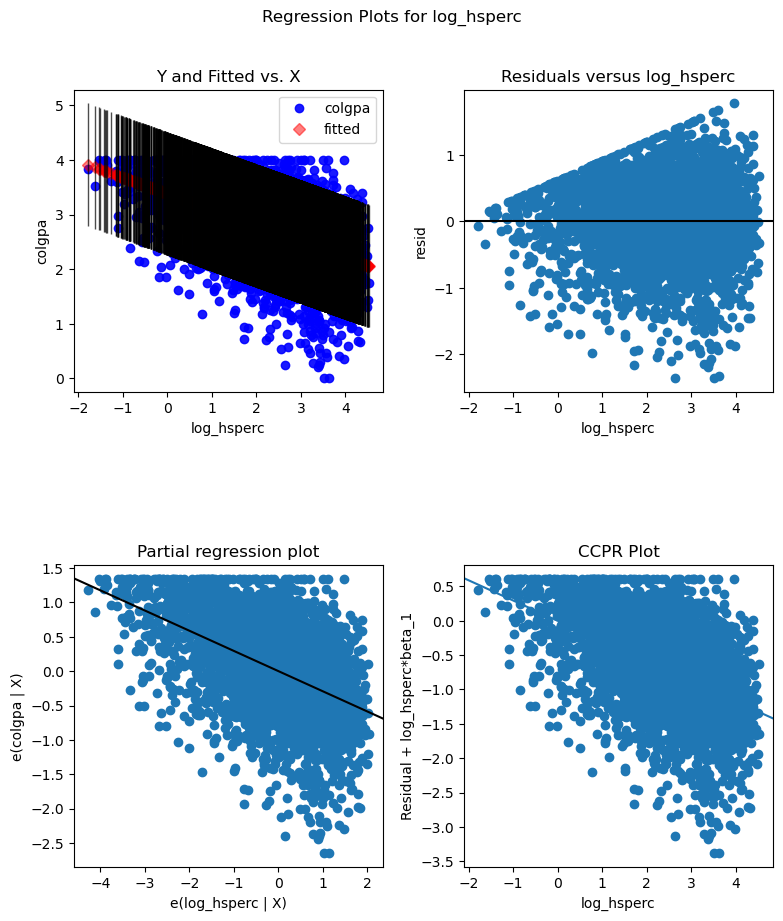

In [97]:
import statsmodels.api as sm
figD = sm.graphics.plot_regress_exog(reg4, "log_hsperc")
figD.set_figheight(10)
figD.set_figwidth(8)
plt.show()

There seems to be a lot of data points falling outside the prediction interval. We also observe heteroskedasticity because the variation in residuals are increasing as log_hsperc increases. We say this is due to the constraint of 4 on the GPA.

[Text(0.5, 0, 'Predicted'), Text(0, 0.5, 'Residuals')]

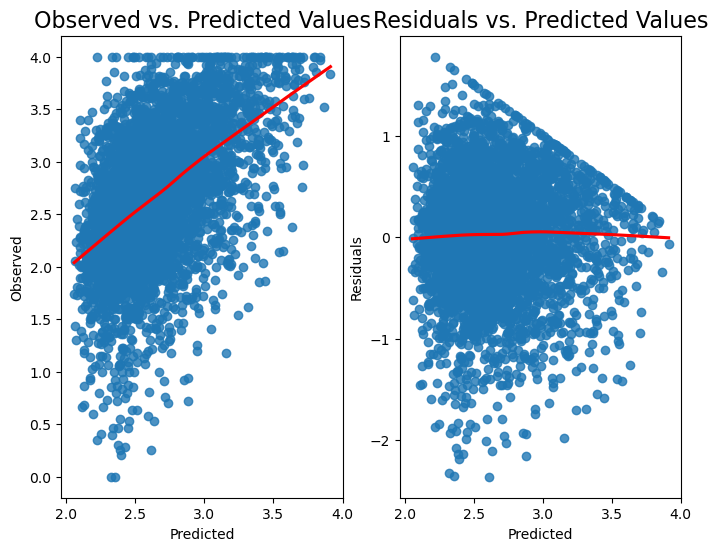

In [98]:
fig, ax = plt.subplots(1,2,figsize=(8, 6))
sns.regplot(x=reg4.fittedvalues, y=gpa2['colgpa'], lowess=True, ax=ax[0], line_kws={'color': 'red'})
ax[0].set_title('Observed vs. Predicted Values', fontsize=16)
ax[0].set(xlabel='Predicted', ylabel='Observed')

sns.regplot(x=reg4.fittedvalues, y=reg4.resid, lowess=True, ax=ax[1], line_kws={'color': 'red'})
ax[1].set_title('Residuals vs. Predicted Values', fontsize=16)
ax[1].set(xlabel='Predicted', ylabel='Residuals')

The relationship between predicted values and observed values appears to be closer to linear than in all our previous models. However, the residuals show greater heroskedasticity.

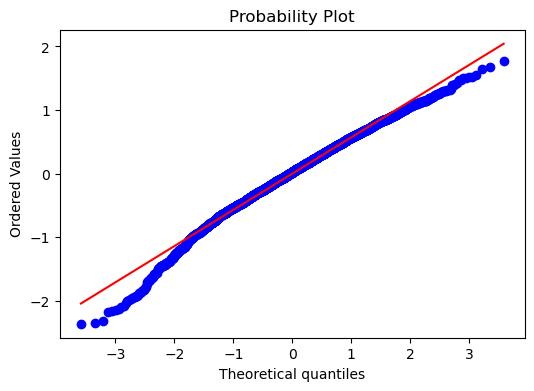

In [99]:
#qq plot of residuals vs normal probability
figA, axA = plt.subplots(figsize=(6,4))
_, (__, ___, r) = sp.stats.probplot(reg4.resid, plot = axA, fit=True)

As mentioned earlier, the residuals do not seem to follow a normal distribution. However, from this Q-Q plot, their distribution seems to deviate less from a normal one than in our first two models.

### Outliers, high leverage, and influential observations

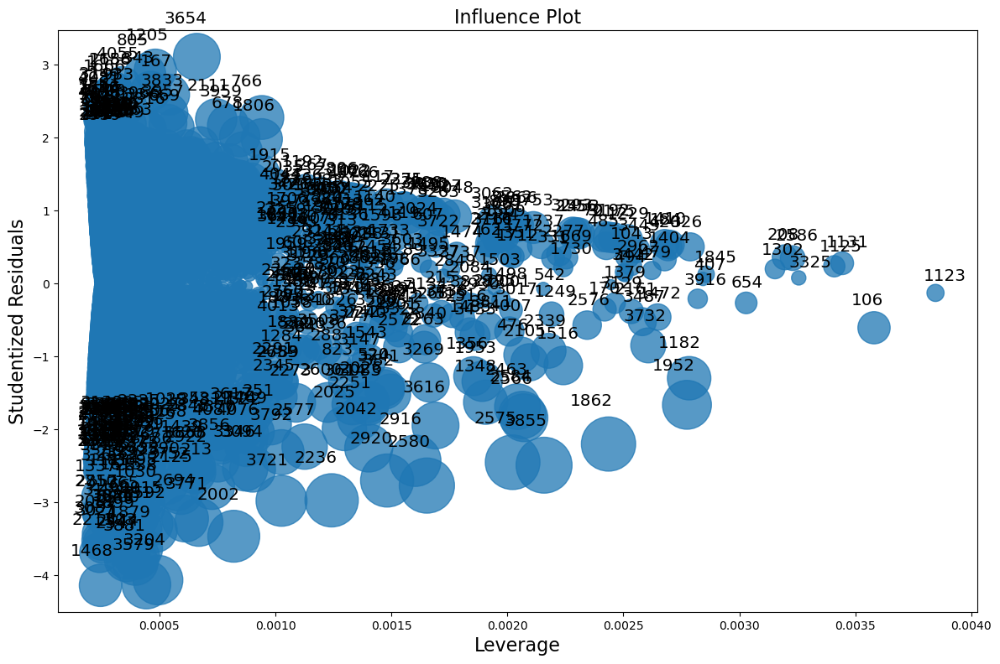

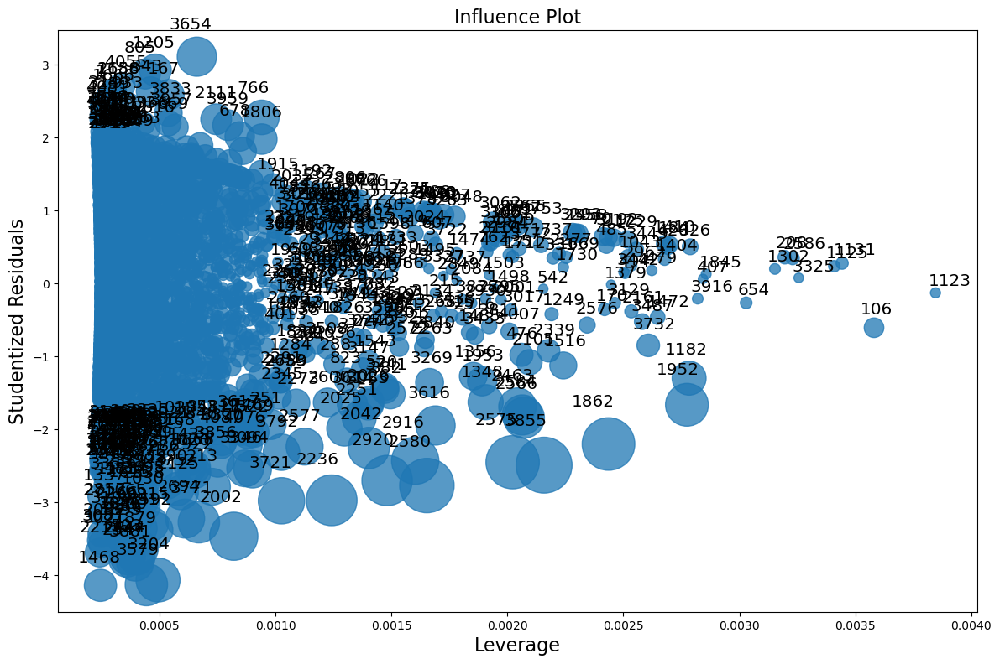

In [100]:
figd, ax = plt.subplots(figsize=(12,8))
figd = sm.graphics.influence_plot(reg4, ax = ax, criterion="DFFITS")
figd.tight_layout(pad=1.0)

fige, ax = plt.subplots(figsize=(12,8))
fige = sm.graphics.influence_plot(reg4, ax = ax, criterion="cooks")
fige.tight_layout(pad=1.0)

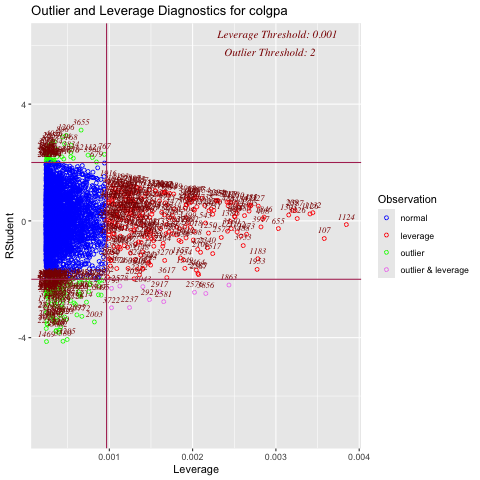

In [101]:
%%R -i gpa2

# Load necessary library for diagnostics
library(olsrr)

# Fit the linear regression model
mreg_mod <- lm(colgpa ~ log_hsperc, data = gpa2)

# Plot DFBETAS to check for influential data points on each coefficient
ols_plot_resid_lev(mreg_mod)

Once more, our sample clearly contains many observations that can be considered outliers, high-leverage, and influential. However, given the really high number of such observations, we decide not to exclude them from our analysis.

### Bootsrapping

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/944658758.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  boot_interc.append(results_temp.params[0])
/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/944658758.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  boot_slopes.append(results_temp.params[1])
/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/944658758.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value b

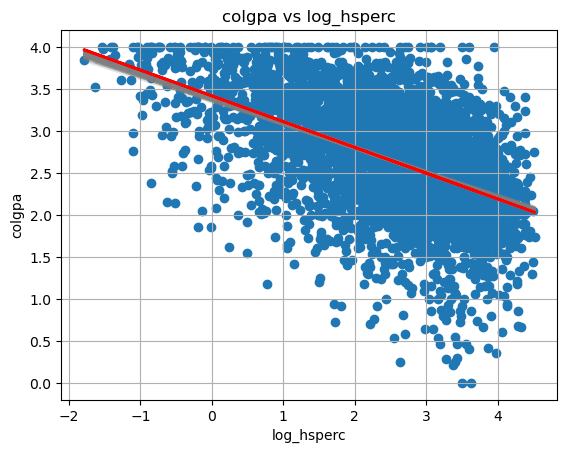

In [103]:
# resample with replacement each row
boot_slopes = []
boot_interc = []
boot_adjR2 = []
n_boots = 100
n_points = gpa2.shape[0]
plt.figure()
for _ in range(n_boots):
 # sample the rows, same size, with replacement
    sample_gpa2 = gpa2.sample(n=n_points, replace=True)
 # fit a linear regression
    ols_model_temp = smf.ols(formula = 'colgpa ~ log_hsperc', data=sample_gpa2)
    results_temp = ols_model_temp.fit()
 
 # append coefficients
    boot_interc.append(results_temp.params[0])
    boot_slopes.append(results_temp.params[1])
    boot_adjR2.append(results_temp.rsquared_adj)
 
 # plot a greyed out line
    y_pred_temp = ols_model_temp.fit().predict(sample_gpa2['log_hsperc'])
    plt.plot(sample_gpa2['log_hsperc'], y_pred_temp, color='grey', alpha=0.2)
# add data points
y_pred = ols_model_temp.fit().predict(gpa2['log_hsperc'])
plt.scatter(gpa2['log_hsperc'], gpa2['colgpa'])
plt.plot(gpa2['log_hsperc'], y_pred, linewidth=2,color = 'red')
plt.grid(True)
plt.xlabel('log_hsperc')
plt.ylabel('colgpa')
plt.title('colgpa vs log_hsperc')
plt.show()

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/2832893836.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.axvline(reg4.params[1],color='red', linestyle='--')


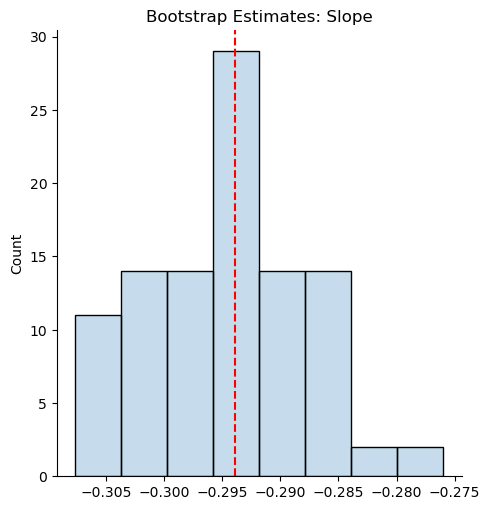

In [104]:
sns.displot(boot_slopes, alpha = 0.25)
plt.axvline(reg4.params[1],color='red', linestyle='--')
plt.title('Bootstrap Estimates: Slope')
plt.show()

# The vertical red line = LS estimate

/var/folders/40/7fb_fdgd0q9dpbbvktnxnpb00000gn/T/ipykernel_59808/2503255217.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.axvline(reg4.params[0],color='red', linestyle='--')


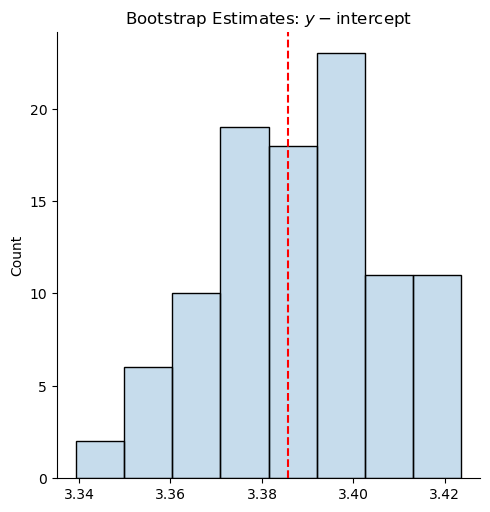

In [105]:
sns.displot(boot_interc, alpha = 0.25)
plt.axvline(reg4.params[0],color='red', linestyle='--')
plt.title('Bootstrap Estimates: $y-$intercept')
plt.show()
# The vertical red line = LS estimate

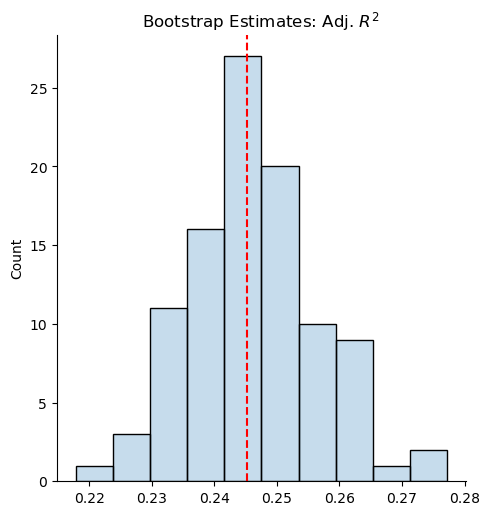

In [106]:
sns.displot(boot_adjR2, alpha = 0.25)
plt.axvline(reg4.rsquared_adj,color='red', linestyle='--')
plt.title('Bootstrap Estimates: Adj. $R^2$')
plt.show()

# The vertical red line = LS estimate

After bootstrapping our model and seeing that our boostrapping estiamte are extremly similar to our LS estimates, we conclude that our estimates are robust - something we expected given the very low p-values on all estimates and the high number of observations in our dataset.

2024-10-25 14:01:37.944 | WARNING  | fitter.fitter:_fit_single_distribution:337 - SKIPPED _fit distribution (taking more than 30 seconds)
2024-10-25 14:01:37.995 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted bradford distribution with error=6.549124)
2024-10-25 14:01:38.050 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted anglit distribution with error=3.315957)
2024-10-25 14:01:38.065 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted cauchy distribution with error=1.068018)
2024-10-25 14:01:38.070 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted arcsine distribution with error=12.214474)
2024-10-25 14:01:38.110 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted beta distribution with error=0.137006)
2024-10-25 14:01:38.138 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted alpha distribution with error=0.276926)
2024-10-25 14:01:38.143 | INFO     | fitter.fitter:_fit_single_distribution:333 -

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
exponweib,0.132686,515.040763,540.351667,inf,0.013500,0.434102
jf_skew_t,0.134749,505.240584,530.551489,inf,0.013071,0.475548
genhyperbolic,0.134890,508.166803,539.805434,inf,0.013238,0.459186
gengamma,0.135257,529.490578,554.801482,inf,0.016844,0.188926
nct,0.135425,505.694594,531.005499,inf,0.013126,0.470139


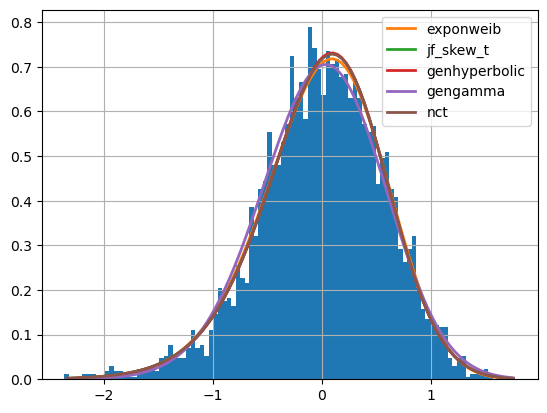

In [107]:
#Fit various distributon
f = Fitter(reg4.resid)
f.fit()

f.summary()

### 5-Fold Cross Validation

MAE: 0.4404417524874769
MSE: 0.30842453187174285
RMSE: 0.5553598219818776
5-Fold CV RMSE Scores: [-0.55878788 -0.54508295 -0.59495038 -0.58741773 -0.5906787 ]
5-Fold CV RMSE Scores: [-0.55878788 -0.54508295 -0.59495038 -0.58741773 -0.5906787 ]


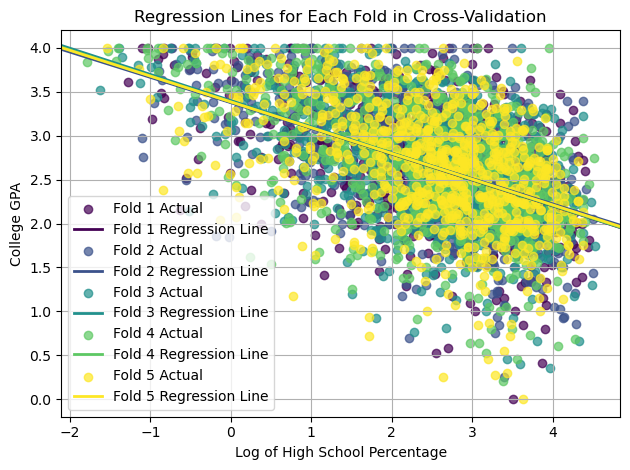

/opt/anaconda3/lib/python3.12/site-packages/scipy/integrate/_quadpack_py.py:1272: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


In [108]:
x = np.log(gpa2[['hsperc']])
y = gpa2[['colgpa']]

# OLS fit using all the data
regr = LinearRegression()
model = regr.fit(x, y)
regr.coef_
regr.intercept_

# Split the data into train  (70%)/test(30%) samples:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

# Train the model:
regr = LinearRegression()
regr.fit(x_train, y_train)

# Make predictions based on the test sample
y_pred = regr.predict(x_test)

# Evaluate Performance
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

# Perform a 5-fold CV
# Use MSE as the scoring function (there are other options as shown here:
regr = linear_model.LinearRegression()
scores = cross_val_score(regr, x, y, cv=5, scoring='neg_root_mean_squared_error')
print('5-Fold CV RMSE Scores:', scores)

# Perform a 5-fold CV
# Use MSE as the scoring function (there are other options as shown here:
regr = linear_model.LinearRegression()
scores = cross_val_score(regr, x, y, cv=5, scoring='neg_root_mean_squared_error')
print('5-Fold CV RMSE Scores:', scores)

# Perform a 5-fold CV and store intercepts and coefficients for each fold
kf = KFold(n_splits=5, shuffle=True, random_state=0)
intercept_list = []
coefficient_list = []
fold_c = ['#440154FF', '#3B528BFF', '#21908CFF', '#5DC863FF', '#FDE725FF']

# K-Fold Cross Validation
for fold, (train_index, test_index) in enumerate(kf.split(x)):
    x_train_fold, x_test_fold = x.iloc[train_index], x.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Train the model for this fold
    regr = LinearRegression()
    regr.fit(x_train_fold, y_train_fold)
    
    # Store the coefficients and intercepts
    intercept = regr.intercept_[0]
    coefficient = regr.coef_[0][0]
    intercept_list.append(intercept)
    coefficient_list.append(coefficient)
    
    # Scatter plot for actual values in the test set
    plt.scatter(x_test_fold, y_test_fold, c=fold_c[fold], alpha=.7, label=f'Fold {fold + 1} Actual')

    # Calculate the predicted values for this fold
    y_pred_fold = regr.predict(x_test_fold)
    
    # Plot the regression line for this fold
    plt.axline(xy1=(0, intercept), slope=coefficient, color=fold_c[fold], 
               label=f'Fold {fold + 1} Regression Line', linewidth=2)

# Customizing the plot
plt.title('Regression Lines for Each Fold in Cross-Validation')
plt.xlabel('Log of High School Percentage')
plt.ylabel('College GPA')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Our model performs really well in a 5-fold cross validation as the regression lines for each fold overlap almost perfectly. This was also expected given the substantial amount of observation in our dataset.

## Conclusion

After testing our 4 models (hsperc, sat, square root of hsperc (hsperc_sqrt), and logarithm of hsperc (log_hsperc)), we concluded that the square root of high school percentile (from the top - 1% being the best) was the best predictor for college GPA.
However, this result may lack robustness due to our approach's limitations. 
By relying solely on univariate models, we omitted potentially significant interactions and contributions from SAT, the other predictor suggested by Boruta and Mallows CP.
Furthermore, when interpreting our model parameters, it’s essential to distinguish statistical significance from economic significance. 
The square root transformation of hsperc (hsperc_sqrt) achieves statistical relevance due to better-fitting residuals and variance reduction. 
However, the economic significance - what it tells us about the practical or causal relationship between high school performance and college GPA - remains ambiguous. 
A multivariate approach could capture a more comprehensive picture of factors influencing GPA, potentially revealing that a combination of SAT scores, family background, and high school performance jointly offer a more economically interpretable model.

## References

- gpa2: Gpa2 in wooldridge: 115 Data Sets from “Introductory Econometrics: A Modern Approach, 7e” by Jeffrey M. Wooldridge. (n.d.). Retrieved October 20, 2024, from https://rdrr.io/cran/wooldridge/man/gpa2.html
- Wooldridge, J. M. (2013). Introductory econometrics: A modern approach (5th ed). South-Western, Cengage Learning.